# **Synovium Hyperparameter search**

In this notebook I run the hyperparameter search for the downstream analysis of treatment differences in the synovium.


# **Imports**

In [1]:
# import the VAE code
import sys
from buddi import buddi
from buddi.preprocessing import sc_preprocess
from buddi.plotting import validation_plotting as vp


# general imports

import warnings
import numpy as np
import scanpy as sc
import scipy


# Images, plots, display, and visualization
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import scale, MinMaxScaler
from matplotlib_venn import venn2
from upsetplot import from_contents, UpSet

# programming stuff
import time
import os
import pickle
from pathlib import Path

# tensorflow stuff
import tensorflow as tf
from tensorflow.keras.optimizers.legacy import Adam
from tensorflow.keras.utils import to_categorical, normalize, plot_model


# disable eager execution
# https://github.com/tensorflow/tensorflow/issues/47311#issuecomment-786116401
from tensorflow.python.framework.ops import disable_eager_execution
disable_eager_execution()


/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/davidnat/

In [3]:
## parameters
sc_aug_data_path = f"{os.getcwd()}/../data/single_cell_data/augmented_synovium_data/"
bulk_aug_data_path = f"{os.getcwd()}/../data/bulk_data/synovium/"
res_data_path = f"{os.getcwd()}/../results/single_cell_data/buddiM2_synovium/"
clinical_file = f"{os.getcwd()}/../data/single_cell_data/synovium/metadata_clin_donor_singlecell.csv"


cibersort_path = f"{os.getcwd()}/../data/single_cell_data/cibersort_synovium/"



cibersort_genes_path = (f"{os.getcwd()}/../results/single_cell_data/cibersort_synovium/" +
                        "CIBERSORTx_Job42_test_cybersort_sig_inferred_phenoclasses" +
                        ".CIBERSORTx_Job42_test_cybersort_sig_inferred_refsample.bm.K999.txt")

num_genes = 7000

exp_id = "all-synovium"
res_id = "toc-synovium"
curr_treatment = "Tocilizumab"

RETRAIN_MODELS = False
RUN_CIBERSORT_GENES = False
RUN_CIBERSORT_SAMPLES = False


# Set-up experimental variables

In [4]:

##################################################
#####. set up experiment specific variables
##################################################

# number expected cell types
n_cell_types = 8

# number of patients/domains/samples expected
n_tot_samples = 23 # 16 bulk and 7 single cell samples -- Tocilizumab

# number of drugs (in this case sexes used for prediction)
# one-hot encoded
n_drugs = 2

# number of types of sequencing (one-hot encoded)
n_tech = 2


# **Load / Pre-process data**
Import pre-processed pseudobulks

In [5]:
# get the info for CIBERSORT for generating the union_genes

if RUN_CIBERSORT_GENES:
    pseudobulks_df, prop_df, gene_df, sig_df, metadata_df = sc_preprocess.read_single_pseudobulk_file(sc_aug_data_path, "BRI-415", "CTRL", "Train", exp_id)
    pseudobulks_df.columns = gene_df

    # now we transpose
    pseudobulks_sparse = scipy.sparse.csr_matrix(pseudobulks_df.values)
    pseudobulks_sparse_t = pseudobulks_sparse.transpose()
    pseudobulks_df = pd.DataFrame.sparse.from_spmatrix(pseudobulks_sparse_t)
    pseudobulks_df.columns = range(pseudobulks_df.shape[1])

    # now write it out
    sc_preprocess.write_cs_bp_files(cibersort_path, exp_id, sig_df, pseudobulks_df)
    sig_samp_df = sig_df

    sig_df_vals = sig_samp_df.iloc[:,1:]
    sig_df_celltype = sig_samp_df.scpred_CellType

    # now we transpose
    sig_sparse = scipy.sparse.csr_matrix(sig_df_vals.values)
    sig_sparse_t = sig_sparse.transpose()
    sig_sparse = pd.DataFrame.sparse.from_spmatrix(sig_sparse_t)
    sig_sparse.columns = sig_df_celltype
    sig_sparse.index = sig_samp_df.columns[1:]

    sig_sparse = pd.DataFrame(sig_sparse)

    sig_out_file = os.path.join(cibersort_path, f"test_cybersort_sig.tsv.gz")
    sig_out_path = Path(sig_out_file)
    sig_sparse = sig_sparse.astype('int')
    sig_sparse.to_csv(sig_out_path, sep='\t',header=True)

    # write out the bulk RNA-seq mixture matrix
    sig_out_file = os.path.join(cibersort_path, f"test_cybersort_mix.tsv.gz")
    sig_out_path = Path(sig_out_file)

    pseudobulks_df.to_csv(sig_out_path, sep='\t',header=True)


In [6]:
in_name = f"synovium_bulk_processed_{curr_treatment}"


# read in the real bulk data
processed_sc_file = f"{bulk_aug_data_path}/{in_name}.h5ad"
adata = sc.read_h5ad(processed_sc_file)


# now get the sc ref training data

# read in order
sample_order = ['BRI-462', 'BRI-458', 'BRI-460', 'BRI-421',
                'BRI-515', 'BRI-415', 'BRI-436']



X_concat = None
Y_concat = None
meta_concat = None
for curr_samp in sample_order:

    print(curr_samp)
    pseudobulks_df, prop_df, gene_df, sig_df, metadata_df = sc_preprocess.read_single_pseudobulk_file(sc_aug_data_path, curr_samp, "CTRL", "Train", exp_id)
    pseudobulks_df.columns = gene_df

    if X_concat is None:
        X_concat, Y_concat, meta_concat = pseudobulks_df, prop_df, metadata_df
    else:
        X_concat = pd.concat([X_concat, pseudobulks_df])
        Y_concat = pd.concat([Y_concat, prop_df])
        meta_concat = pd.concat([meta_concat, metadata_df])

# remove cell type specific
#non_ct_spec = np.where(meta_concat.cell_prop_type != "cell_type_specific")[0]
#X_concat = X_concat.iloc[non_ct_spec]
#Y_concat = Y_concat.iloc[non_ct_spec]
#meta_concat = meta_concat.iloc[non_ct_spec]


# format the bulk data
real_bulk_df = pd.DataFrame(adata.X.todense(), columns=adata.var_names, index=adata.obs.index)
real_bulk_meta_df = adata.obs

# select genes that are in both
intersect_genes = np.intersect1d(gene_df, real_bulk_df.columns)
X_concat = X_concat[intersect_genes]
real_bulk_df = real_bulk_df[intersect_genes]

# now we have a new gene_df
gene_df = pd.DataFrame(intersect_genes)
gene_df.columns = ["gene_ids"]
gene_df.set_index(gene_df["gene_ids"])
gene_df = gene_df.gene_ids

# get the bulk metadata formatted
real_bulk_meta_df = real_bulk_meta_df[["sample_id", "stim"]]
real_bulk_meta_df["isTraining"] = "Train"
real_bulk_meta_df["cell_prop_type"] = "realistic"
real_bulk_meta_df["samp_type"] = "bulk"
real_bulk_meta_df['sample_id'] = real_bulk_meta_df['sample_id'].astype(str)

# put the reference singlecell and real bulk it all together
X_full = pd.concat([X_concat, real_bulk_df])
Y_full = pd.concat([Y_concat, Y_concat.iloc[range(real_bulk_df.shape[0])]]) ## stop gap for now
meta_df = pd.concat([meta_concat, real_bulk_meta_df])

# add clinical info
clinical_df = pd.read_csv(clinical_file)
clinical_df = meta_df.merge(clinical_df, left_on="sample_id", right_on="mRNA_run", how='left')
meta_df = clinical_df

# update technologies
#sc_tech_idx = np.where(meta_df.samp_type == "sc_ref")[0]
#meta_df.samp_type.iloc[sc_tech_idx] = meta_df.single_cell_tech.iloc[sc_tech_idx]

# index for checking correlations
sc_idx = np.where(meta_df.samp_type != "bulk")[0]
bulk_idx = np.where(meta_df.samp_type == "bulk")[0]


BRI-462
BRI-458
BRI-460
BRI-421
BRI-515
BRI-415
BRI-436


/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_78683/1716971820.py:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  real_bulk_meta_df["isTraining"] = "Train"
/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_78683/1716971820.py:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  real_bulk_meta_df["cell_prop_type"] = "realistic"
/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_78683/1716971820.py:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from 

In [7]:
X_concat

gene_ids,A1BG,A1BG-AS1,A2M,A2M-AS1,A4GALT,AAAS,AACS,AADAT,AAGAB,AAK1,...,ZW10,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1
0,37.0,3.0,110.0,6.0,197.0,30.0,49.0,10.0,48.0,128.0,...,21.0,21.0,8.0,6.0,9.0,28.0,0.0,95.0,108.0,45.0
0,22.0,2.0,74.0,12.0,200.0,40.0,47.0,8.0,43.0,116.0,...,23.0,16.0,11.0,6.0,12.0,30.0,0.0,117.0,165.0,39.0
0,14.0,2.0,84.0,5.0,188.0,49.0,45.0,9.0,37.0,131.0,...,22.0,15.0,7.0,6.0,7.0,19.0,0.0,86.0,120.0,49.0
0,8.0,1.0,73.0,8.0,216.0,29.0,44.0,7.0,21.0,130.0,...,22.0,21.0,6.0,4.0,12.0,25.0,0.0,92.0,142.0,48.0
0,22.0,2.0,44.0,4.0,176.0,42.0,58.0,8.0,39.0,148.0,...,18.0,10.0,5.0,8.0,11.0,39.0,0.0,73.0,88.0,51.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,27.0,4.0,2681.0,1.0,190.0,28.0,16.0,3.0,35.0,159.0,...,29.0,16.0,10.0,12.0,10.0,38.0,0.0,80.0,153.0,42.0
0,25.0,6.0,3196.0,4.0,176.0,35.0,32.0,8.0,29.0,189.0,...,18.0,27.0,5.0,14.0,12.0,36.0,0.0,68.0,151.0,84.0
0,27.0,8.0,3072.0,4.0,183.0,35.0,19.0,6.0,30.0,171.0,...,13.0,21.0,5.0,11.0,11.0,22.0,0.0,100.0,131.0,53.0
0,17.0,2.0,3246.0,4.0,204.0,36.0,21.0,2.0,28.0,175.0,...,17.0,12.0,9.0,14.0,7.0,35.0,0.0,79.0,144.0,58.0


In [8]:
# get the info for CIBERSORT for generating the mixture

if RUN_CIBERSORT_SAMPLES: 
    _, _, _, sig_df, _ = sc_preprocess.read_single_pseudobulk_file(sc_aug_data_path, "BRI-462", "CTRL", "Train", exp_id)

    # now we format the real bulks
    cibersort_bulk = real_bulk_df
    cibersort_bulk = cibersort_bulk.transpose()
    cibersort_bulk

    sig_out_file = os.path.join(bulk_aug_data_path, f"bulk_cibersort_{curr_treatment}.tsv")
    sig_out_path = Path(sig_out_file)

    cibersort_bulk.to_csv(sig_out_path, sep='\t',header=True)



In [9]:
# double check all the pseudobulks/bulks were read in
meta_df.sample_id.value_counts()

BRI-462         5800
BRI-460         5800
BRI-421         5800
BRI-515         5800
BRI-415         5800
BRI-436         5800
BRI-458         5800
R4RAPAT00142       2
R4RAPAT00066       2
R4RAPAT00060       2
R4RAPAT00056       2
R4RAPAT00047       2
R4RAPAT00027       2
R4RAPAT00145       2
R4RAPAT00117       2
R4RAPAT00140       2
R4RAPAT00129       2
R4RAPAT00118       2
R4RAPAT00114       2
R4RAPAT00110       2
R4RAPAT00107       2
R4RAPAT00099       2
R4RAPAT00072       2
Name: sample_id, dtype: int64

In [11]:
meta_df

,sample_id,stim,isTraining,cell_prop_type,samp_type,subject_id,pipeline_date,site,treatment,biopsied,...,disease_duration,tissue_type,krenn_lining,krenn_inflammation,single_cell_tech,cell_count_to_10x,mRNA_run,protein_run,atac_run,qc
0,BRI-462,CTRL,Train,random,sc_ref,300-1930,8/22/19,UK London,1,Knee,...,0.0,Biopsy,1.67,2.33,CITEseq + flow/bulk + re-freeze,"13,500",BRI-462,BRI-463,BRI-546,Pass
1,BRI-462,CTRL,Train,random,sc_ref,300-1930,8/22/19,UK London,1,Knee,...,0.0,Biopsy,1.67,2.33,CITEseq + flow/bulk + re-freeze,"13,500",BRI-462,BRI-463,BRI-546,Pass
2,BRI-462,CTRL,Train,random,sc_ref,300-1930,8/22/19,UK London,1,Knee,...,0.0,Biopsy,1.67,2.33,CITEseq + flow/bulk + re-freeze,"13,500",BRI-462,BRI-463,BRI-546,Pass
3,BRI-462,CTRL,Train,random,sc_ref,300-1930,8/22/19,UK London,1,Knee,...,0.0,Biopsy,1.67,2.33,CITEseq + flow/bulk + re-freeze,"13,500",BRI-462,BRI-463,BRI-546,Pass
4,BRI-462,CTRL,Train,random,sc_ref,300-1930,8/22/19,UK London,1,Knee,...,0.0,Biopsy,1.67,2.33,CITEseq + flow/bulk + re-freeze,"13,500",BRI-462,BRI-463,BRI-546,Pass
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40627,R4RAPAT00060,STIM,Train,realistic,bulk,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
40628,R4RAPAT00066,CTRL,Train,realistic,bulk,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
40629,R4RAPAT00066,STIM,Train,realistic,bulk,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
40630,R4RAPAT00072,CTRL,Train,realistic,bulk,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [12]:
Y_full

,NK,B,Endothelial,Fibroblast,Myeloid,T_CD4,T_CD8,T_other
0,0.010,0.245,0.070,0.040,0.040,0.230,0.355,0.010
0,0.105,0.070,0.135,0.105,0.150,0.155,0.130,0.150
0,0.115,0.050,0.215,0.230,0.040,0.050,0.160,0.140
0,0.120,0.200,0.200,0.015,0.030,0.025,0.355,0.055
0,0.010,0.005,0.005,0.020,0.930,0.005,0.005,0.020
...,...,...,...,...,...,...,...,...
0,0.095,0.020,0.155,0.665,0.010,0.030,0.005,0.020
0,0.400,0.060,0.140,0.100,0.055,0.005,0.020,0.220
0,0.015,0.140,0.070,0.240,0.470,0.040,0.015,0.010
0,0.200,0.150,0.160,0.020,0.220,0.115,0.090,0.045


In [13]:
X_full

,A1BG,A1BG-AS1,A2M,A2M-AS1,A4GALT,AAAS,AACS,AADAT,AAGAB,AAK1,...,ZW10,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1
0,37.0,3.0,110.0,6.0,197.0,30.0,49.0,10.0,48.0,128.0,...,21.0,21.0,8.0,6.0,9.0,28.0,0.0,95.0,108.0,45.0
0,22.0,2.0,74.0,12.0,200.0,40.0,47.0,8.0,43.0,116.0,...,23.0,16.0,11.0,6.0,12.0,30.0,0.0,117.0,165.0,39.0
0,14.0,2.0,84.0,5.0,188.0,49.0,45.0,9.0,37.0,131.0,...,22.0,15.0,7.0,6.0,7.0,19.0,0.0,86.0,120.0,49.0
0,8.0,1.0,73.0,8.0,216.0,29.0,44.0,7.0,21.0,130.0,...,22.0,21.0,6.0,4.0,12.0,25.0,0.0,92.0,142.0,48.0
0,22.0,2.0,44.0,4.0,176.0,42.0,58.0,8.0,39.0,148.0,...,18.0,10.0,5.0,8.0,11.0,39.0,0.0,73.0,88.0,51.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
R4RAPAT00060-week16,351.0,45.0,14612.0,148.0,3123.0,2216.0,1470.0,222.0,987.0,1508.0,...,496.0,267.0,177.0,172.0,325.0,1410.0,76.0,1088.0,4101.0,2929.0
R4RAPAT00066-week0,716.0,18.0,4593.0,43.0,627.0,1022.0,575.0,93.0,1322.0,519.0,...,387.0,278.0,571.0,69.0,105.0,252.0,13.0,591.0,2502.0,561.0
R4RAPAT00066-week16,349.0,49.0,21424.0,98.0,1701.0,2399.0,1513.0,162.0,1096.0,1358.0,...,482.0,248.0,273.0,146.0,286.0,1089.0,25.0,848.0,7027.0,2396.0
R4RAPAT00072-week0,544.0,2.0,2784.0,3.0,309.0,172.0,401.0,4.0,227.0,1645.0,...,152.0,94.0,182.0,22.0,40.0,113.0,45.0,686.0,563.0,398.0


In [14]:
# check correlation between bulk and single cell
# we want them to be similar between bulk+sc and within bulk
sc_check = sc_idx[0]
bulk_check = bulk_idx[0]
print(np.corrcoef((X_full.iloc[sc_check] / np.sum(X_full.iloc[sc_check])), (X_full.iloc[bulk_check] / np.sum(X_full.iloc[bulk_check]))))

bulk_check = bulk_idx[1]
print(np.corrcoef((X_full.iloc[sc_check] / np.sum(X_full.iloc[sc_check])), (X_full.iloc[bulk_check] / np.sum(X_full.iloc[bulk_check]))))


bulk_check = bulk_idx[2]
print(np.corrcoef((X_full.iloc[sc_check] / np.sum(X_full.iloc[sc_check])), (X_full.iloc[bulk_check] / np.sum(X_full.iloc[bulk_check]))))


bulk_check = bulk_idx[5]
print(np.corrcoef((X_full.iloc[sc_check] / np.sum(X_full.iloc[sc_check])), (X_full.iloc[bulk_check] / np.sum(X_full.iloc[bulk_check]))))


bulk_check = bulk_idx[12]
print(np.corrcoef((X_full.iloc[sc_check] / np.sum(X_full.iloc[sc_check])), (X_full.iloc[bulk_check] / np.sum(X_full.iloc[bulk_check]))))

[[1.         0.56644897]
 [0.56644897 1.        ]]
[[1.         0.49099839]
 [0.49099839 1.        ]]
[[1.        0.5751983]
 [0.5751983 1.       ]]
[[1.         0.49536771]
 [0.49536771 1.        ]]
[[1.         0.14218049]
 [0.14218049 1.        ]]


In [15]:
# check correlation within bulk
bulk_check0 = bulk_idx[0]
bulk_check1 = bulk_idx[1]

print(np.corrcoef((X_full.iloc[bulk_check0] / np.sum(X_full.iloc[bulk_check0])), (X_full.iloc[bulk_check1] / np.sum(X_full.iloc[bulk_check1]))))

bulk_check1 = bulk_idx[1]
print(np.corrcoef((X_full.iloc[bulk_check0] / np.sum(X_full.iloc[bulk_check0])), (X_full.iloc[bulk_check1] / np.sum(X_full.iloc[bulk_check1]))))


bulk_check1 = bulk_idx[2]
print(np.corrcoef((X_full.iloc[bulk_check0] / np.sum(X_full.iloc[bulk_check0])), (X_full.iloc[bulk_check1] / np.sum(X_full.iloc[bulk_check1]))))


bulk_check1 = bulk_idx[5]
print(np.corrcoef((X_full.iloc[bulk_check0] / np.sum(X_full.iloc[bulk_check0])), (X_full.iloc[bulk_check1] / np.sum(X_full.iloc[bulk_check1]))))


bulk_check1 = bulk_idx[12]
print(np.corrcoef((X_full.iloc[bulk_check0] / np.sum(X_full.iloc[bulk_check0])), (X_full.iloc[bulk_check1] / np.sum(X_full.iloc[bulk_check1]))))

[[1.         0.59242035]
 [0.59242035 1.        ]]
[[1.         0.59242035]
 [0.59242035 1.        ]]
[[1.         0.65580626]
 [0.65580626 1.        ]]
[[1.         0.74639546]
 [0.74639546 1.        ]]
[[1.         0.36088223]
 [0.36088223 1.        ]]


In [16]:
# check correlation within sc
sc_check0 = sc_idx[0]
sc_check1 = sc_idx[5000]

print(np.corrcoef((X_full.iloc[sc_check0] / np.sum(X_full.iloc[sc_check0])), (X_full.iloc[sc_check1] / np.sum(X_full.iloc[sc_check1]))))

sc_check1 = sc_idx[1]
print(np.corrcoef((X_full.iloc[sc_check0] / np.sum(X_full.iloc[sc_check0])), (X_full.iloc[sc_check1] / np.sum(X_full.iloc[sc_check1]))))


sc_check1 = sc_idx[2]
print(np.corrcoef((X_full.iloc[sc_check0] / np.sum(X_full.iloc[sc_check0])), (X_full.iloc[sc_check1] / np.sum(X_full.iloc[sc_check1]))))


sc_check1 = sc_idx[5]
print(np.corrcoef((X_full.iloc[sc_check0] / np.sum(X_full.iloc[sc_check0])), (X_full.iloc[sc_check1] / np.sum(X_full.iloc[sc_check1]))))


sc_check1 = sc_idx[12]
print(np.corrcoef((X_full.iloc[sc_check0] / np.sum(X_full.iloc[sc_check0])), (X_full.iloc[sc_check1] / np.sum(X_full.iloc[sc_check1]))))

[[1.        0.9516775]
 [0.9516775 1.       ]]
[[1.       0.992194]
 [0.992194 1.      ]]
[[1.         0.99264775]
 [0.99264775 1.        ]]
[[1.         0.99781869]
 [0.99781869 1.        ]]
[[1.        0.9965749]
 [0.9965749 1.       ]]


# Define indices and set-up metadata

In [17]:

##################################################
#####. Design the experiment
##################################################


X_orig = np.copy(X_full)

# set up the metadata arrays and indices
samp_label = np.asarray(meta_df.sample_id)
index_label, numeric_label = np.unique(samp_label, return_inverse=True)
Label_full = numeric_label
label_full = to_categorical(numeric_label)

samp_drug = np.asarray(meta_df.stim)
index_drug, numeric_drug = np.unique(samp_drug, return_inverse=True)
Drug_full = numeric_drug
drug_full = to_categorical(numeric_drug)

samp_bulk = np.asarray(meta_df.samp_type)
index_bulk, numeric_bulk = np.unique(samp_bulk, return_inverse=True)
Bulk_full = numeric_bulk
bulk_full = to_categorical(numeric_bulk)


idx_train = np.where(meta_df.isTraining=="Train")[0] 
idx_test = np.where(meta_df.isTraining!="Train")[0] 
idx_bulk = np.where(meta_df.samp_type == "bulk")[0]
idx_sc = np.where(meta_df.samp_type != "bulk")[0]
idx_drug = np.where(meta_df.stim == "STIM")[0]
idx_random = np.where(meta_df.cell_prop_type == "random")[0]

Y_max = np.copy(Y_full)
Y_max = np.argmax(Y_max, axis=1)
Y_max = Y_full.columns[Y_max]
meta_df["Y_max"] = Y_max

# now seperate out the training and testing data
X_train_df = X_full.iloc[idx_train]
Y_train_df = Y_full.iloc[idx_train]


# try using the cibersort genes
cibersort_df = pd.read_csv(cibersort_genes_path, sep="\t" )
cibersort_genes = cibersort_df["NAME"].values.tolist()

# only keep cibersort genes that are in common genes
cibersort_genes = np.intersect1d(gene_df, cibersort_genes)



# convert to data matrices
X_train = X_train_df.to_numpy()
Y_train = Y_train_df.to_numpy()

## get the top variable genes
X_colmean = X_train.mean(axis=0)
X_colvar = X_train.var(axis=0)
X_CoV = np.array(np.divide(X_colvar, X_colmean+0.001))

# need to get the genes such that
# the union of the highly variable and the
# CIBERSORTx genes are 7000 total
num_genes_found = False
initial_count = 7000
while not num_genes_found:
    idx_top = np.argpartition(X_CoV, -initial_count)[-initial_count:]
    top_gene_df = gene_df.iloc[idx_top]
    CoV_only = np.union1d(top_gene_df, cibersort_genes)
    if len(CoV_only) == 7000:
        num_genes_found = True
    else:
        initial_count = initial_count -1

idx_top = np.argpartition(X_CoV, -initial_count)[-initial_count:] # num_genes to get 1550
gene_df = gene_df.iloc[idx_top]


In [18]:
X_CoV.shape

(16153,)

# Make sure our test/train indicies are correct

We want to make sure we have paired treated+untreated bulks and untreated single-cell.

In [19]:
np.unique(Bulk_full,  return_counts=True)

(array([0, 1]), array([   32, 40600]))

In [20]:
tab = meta_df.groupby(['samp_type', 'sample_id']).size()
tab.unstack()

sample_id,BRI-415,BRI-421,BRI-436,BRI-458,BRI-460,BRI-462,BRI-515,R4RAPAT00027,R4RAPAT00047,R4RAPAT00056,...,R4RAPAT00099,R4RAPAT00107,R4RAPAT00110,R4RAPAT00114,R4RAPAT00117,R4RAPAT00118,R4RAPAT00129,R4RAPAT00140,R4RAPAT00142,R4RAPAT00145
samp_type,,,,,,,,,,,,,,,,,,,,,
bulk,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
sc_ref,5800.0,5800.0,5800.0,5800.0,5800.0,5800.0,5800.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [21]:
tab = meta_df.groupby(['isTraining', 'samp_type']).size()
tab.unstack()

samp_type,bulk,sc_ref
isTraining,,
Train,32,40600


In [22]:
tab = meta_df.iloc[idx_train].groupby(['isTraining', 'stim']).size()
tab.unstack()

stim,CTRL,STIM
isTraining,,
Train,40616,16


In [23]:
tab = meta_df.iloc[idx_train].groupby(['isTraining', 'samp_type']).size()
tab.unstack()

samp_type,bulk,sc_ref
isTraining,,
Train,32,40600


# compare our variable genes with cibersort defined genes

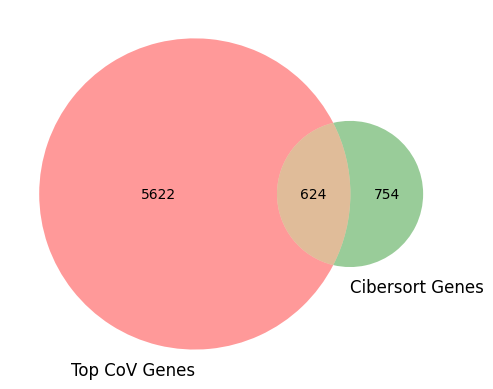

In [24]:

venn2([set(gene_df), set(cibersort_genes)], set_labels = ('Top CoV Genes', 'Cibersort Genes'))
plt.show()

In [25]:
union_genes = np.union1d(gene_df, cibersort_genes)
#union_genes = gene_df
len(union_genes)

7000

In [26]:
X_full = X_full.loc[:,union_genes]


In [27]:
# check quantile estimates

print(np.quantile(X_full, 0.9))
print(np.quantile(X_full.iloc[sc_idx], 0.9))
print(np.quantile(X_full.iloc[bulk_idx], 0.9))


426.0
423.0
5156.0


In [28]:
# check correlation between bulk and single cell
sc_check = sc_idx[0]
bulk_check = bulk_idx[0]
print(np.corrcoef((X_full.iloc[sc_check] / np.sum(X_full.iloc[sc_check])), (X_full.iloc[bulk_check] / np.sum(X_full.iloc[bulk_check]))))

bulk_check = bulk_idx[1]
print(np.corrcoef((X_full.iloc[sc_check] / np.sum(X_full.iloc[sc_check])), (X_full.iloc[bulk_check] / np.sum(X_full.iloc[bulk_check]))))


bulk_check = bulk_idx[2]
print(np.corrcoef((X_full.iloc[sc_check] / np.sum(X_full.iloc[sc_check])), (X_full.iloc[bulk_check] / np.sum(X_full.iloc[bulk_check]))))


bulk_check = bulk_idx[5]
print(np.corrcoef((X_full.iloc[sc_check] / np.sum(X_full.iloc[sc_check])), (X_full.iloc[bulk_check] / np.sum(X_full.iloc[bulk_check]))))


bulk_check = bulk_idx[12]
print(np.corrcoef((X_full.iloc[sc_check] / np.sum(X_full.iloc[sc_check])), (X_full.iloc[bulk_check] / np.sum(X_full.iloc[bulk_check]))))

[[1.         0.56113743]
 [0.56113743 1.        ]]
[[1.         0.48412084]
 [0.48412084 1.        ]]
[[1.         0.57013805]
 [0.57013805 1.        ]]
[[1.         0.48844159]
 [0.48844159 1.        ]]
[[1.         0.13623755]
 [0.13623755 1.        ]]


In [29]:
# check correlation within bulk
bulk_check0 = bulk_idx[0]
bulk_check1 = bulk_idx[1]

print(np.corrcoef((X_full.iloc[bulk_check0] / np.sum(X_full.iloc[bulk_check0])), (X_full.iloc[bulk_check1] / np.sum(X_full.iloc[bulk_check1]))))

bulk_check1 = bulk_idx[1]
print(np.corrcoef((X_full.iloc[bulk_check0] / np.sum(X_full.iloc[bulk_check0])), (X_full.iloc[bulk_check1] / np.sum(X_full.iloc[bulk_check1]))))


bulk_check1 = bulk_idx[2]
print(np.corrcoef((X_full.iloc[bulk_check0] / np.sum(X_full.iloc[bulk_check0])), (X_full.iloc[bulk_check1] / np.sum(X_full.iloc[bulk_check1]))))


bulk_check1 = bulk_idx[5]
print(np.corrcoef((X_full.iloc[bulk_check0] / np.sum(X_full.iloc[bulk_check0])), (X_full.iloc[bulk_check1] / np.sum(X_full.iloc[bulk_check1]))))


bulk_check1 = bulk_idx[12]
print(np.corrcoef((X_full.iloc[bulk_check0] / np.sum(X_full.iloc[bulk_check0])), (X_full.iloc[bulk_check1] / np.sum(X_full.iloc[bulk_check1]))))

[[1.         0.57935824]
 [0.57935824 1.        ]]
[[1.         0.57935824]
 [0.57935824 1.        ]]
[[1.         0.64700203]
 [0.64700203 1.        ]]
[[1.         0.73768424]
 [0.73768424 1.        ]]
[[1.         0.35459345]
 [0.35459345 1.        ]]


In [30]:
# check correlation within sc
sc_check0 = sc_idx[0]
sc_check1 = sc_idx[5000]

print(np.corrcoef((X_full.iloc[sc_check0] / np.sum(X_full.iloc[sc_check0])), (X_full.iloc[sc_check1] / np.sum(X_full.iloc[sc_check1]))))

sc_check1 = sc_idx[1]
print(np.corrcoef((X_full.iloc[sc_check0] / np.sum(X_full.iloc[sc_check0])), (X_full.iloc[sc_check1] / np.sum(X_full.iloc[sc_check1]))))


sc_check1 = sc_idx[2]
print(np.corrcoef((X_full.iloc[sc_check0] / np.sum(X_full.iloc[sc_check0])), (X_full.iloc[sc_check1] / np.sum(X_full.iloc[sc_check1]))))


sc_check1 = sc_idx[5]
print(np.corrcoef((X_full.iloc[sc_check0] / np.sum(X_full.iloc[sc_check0])), (X_full.iloc[sc_check1] / np.sum(X_full.iloc[sc_check1]))))


sc_check1 = sc_idx[12]
print(np.corrcoef((X_full.iloc[sc_check0] / np.sum(X_full.iloc[sc_check0])), (X_full.iloc[sc_check1] / np.sum(X_full.iloc[sc_check1]))))

[[1.         0.95133747]
 [0.95133747 1.        ]]
[[1.         0.99218047]
 [0.99218047 1.        ]]
[[1.         0.99261305]
 [0.99261305 1.        ]]
[[1.         0.99780936]
 [0.99780936 1.        ]]
[[1.         0.99655594]
 [0.99655594 1.        ]]


# Normalize data

In [31]:
X_full = X_full.loc[:,union_genes]

# rescale sc_ref and bulks
median_sc_ref = np.median(np.quantile(X_full.iloc[sc_idx], axis=1, q=0.9))
median_bulk = np.median(np.quantile(X_full.iloc[bulk_idx], axis=1, q=0.9))

ratio_medians = median_bulk/median_sc_ref

X_full.iloc[sc_idx] = X_full.iloc[sc_idx]*ratio_medians


In [32]:
ratio_medians

12.048021291367732

In [33]:
# check quantile estimates

print(np.quantile(X_full, 0.9))
print(np.quantile(X_full.iloc[sc_idx], 0.9))
print(np.quantile(X_full.iloc[bulk_idx], 0.9))


5096.313006248551
5096.313006248551
5156.0


In [34]:

## normalize within sample
clip_upper = np.quantile(X_full, 0.9)
X_full = np.clip(X_full, 0, clip_upper)
scaler = MinMaxScaler()
scaler.fit(X_full)

# now normalize with the scaler trained on the 
# training data
X_full = np.clip(X_full, 0, clip_upper)
X_full = scaler.transform(X_full)


# for unknown proportions; 
# this is bulks used in training
idx_bulk_train = np.intersect1d(idx_bulk, idx_train) 
X_unkp = X_full[idx_bulk_train,]
label_unkp = label_full[idx_bulk_train,]
drug_unkp = drug_full[idx_bulk_train,]
bulk_unkp = bulk_full[idx_bulk_train,]
y_unkp = Y_full.iloc[idx_bulk_train]
y_unkp = y_unkp.to_numpy()

# for known proportions
idx_sc_train = np.intersect1d(idx_sc, idx_train) 
X_kp = X_full[idx_sc_train,]
label_kp = label_full[idx_sc_train,]
drug_kp = drug_full[idx_sc_train,]
bulk_kp = bulk_full[idx_sc_train,]
y_kp = Y_full.iloc[idx_sc_train]
y_kp = y_kp.to_numpy()


In [35]:
# check correlation between bulk and single cell
sc_check = sc_idx[0]
bulk_check = bulk_idx[0]
print(np.corrcoef((X_full[sc_check] / np.sum(X_full[sc_check])), (X_full[bulk_check] / np.sum(X_full[bulk_check]))))

bulk_check = bulk_idx[1]
print(np.corrcoef((X_full[sc_check] / np.sum(X_full[sc_check])), (X_full[bulk_check] / np.sum(X_full[bulk_check]))))


bulk_check = bulk_idx[2]
print(np.corrcoef((X_full[sc_check] / np.sum(X_full[sc_check])), (X_full[bulk_check] / np.sum(X_full[bulk_check]))))


bulk_check = bulk_idx[5]
print(np.corrcoef((X_full[sc_check] / np.sum(X_full[sc_check])), (X_full[bulk_check] / np.sum(X_full[bulk_check]))))


bulk_check = bulk_idx[12]
print(np.corrcoef((X_full[sc_check] / np.sum(X_full[sc_check])), (X_full[bulk_check] / np.sum(X_full[bulk_check]))))

[[1.         0.45442775]
 [0.45442775 1.        ]]
[[1.         0.40532332]
 [0.40532332 1.        ]]
[[1.         0.27722446]
 [0.27722446 1.        ]]
[[1.         0.49351506]
 [0.49351506 1.        ]]
[[1.         0.25509613]
 [0.25509613 1.        ]]


In [36]:
# check correlation within bulk
bulk_check0 = bulk_idx[0]
bulk_check1 = bulk_idx[1]

print(np.corrcoef((X_full[bulk_check0] / np.sum(X_full[bulk_check0])), (X_full[bulk_check1] / np.sum(X_full[bulk_check1]))))

bulk_check1 = bulk_idx[1]
print(np.corrcoef((X_full[bulk_check0] / np.sum(X_full[bulk_check0])), (X_full[bulk_check1] / np.sum(X_full[bulk_check1]))))


bulk_check1 = bulk_idx[2]
print(np.corrcoef((X_full[bulk_check0] / np.sum(X_full[bulk_check0])), (X_full[bulk_check1] / np.sum(X_full[bulk_check1]))))


bulk_check1 = bulk_idx[5]
print(np.corrcoef((X_full[bulk_check0] / np.sum(X_full[bulk_check0])), (X_full[bulk_check1] / np.sum(X_full[bulk_check1]))))


bulk_check1 = bulk_idx[12]
print(np.corrcoef((X_full[bulk_check0] / np.sum(X_full[bulk_check0])), (X_full[bulk_check1] / np.sum(X_full[bulk_check1]))))

[[1.         0.59466352]
 [0.59466352 1.        ]]
[[1.         0.59466352]
 [0.59466352 1.        ]]
[[1.         0.58112874]
 [0.58112874 1.        ]]
[[1.         0.75426665]
 [0.75426665 1.        ]]
[[1.         0.50742333]
 [0.50742333 1.        ]]


In [37]:
# check correlation within sc
sc_check0 = sc_idx[0]
sc_check1 = sc_idx[5000]

print(np.corrcoef((X_full[sc_check0] / np.sum(X_full[sc_check0])), (X_full[sc_check1] / np.sum(X_full[sc_check1]))))

sc_check1 = sc_idx[1]
print(np.corrcoef((X_full[sc_check0] / np.sum(X_full[sc_check0])), (X_full[sc_check1] / np.sum(X_full[sc_check1]))))


sc_check1 = sc_idx[2]
print(np.corrcoef((X_full[sc_check0] / np.sum(X_full[sc_check0])), (X_full[sc_check1] / np.sum(X_full[sc_check1]))))


sc_check1 = sc_idx[5]
print(np.corrcoef((X_full[sc_check0] / np.sum(X_full[sc_check0])), (X_full[sc_check1] / np.sum(X_full[sc_check1]))))


sc_check1 = sc_idx[12]
print(np.corrcoef((X_full[sc_check0] / np.sum(X_full[sc_check0])), (X_full[sc_check1] / np.sum(X_full[sc_check1]))))

[[1.         0.94078694]
 [0.94078694 1.        ]]
[[1.         0.97755339]
 [0.97755339 1.        ]]
[[1.         0.97363673]
 [0.97363673 1.        ]]
[[1.        0.9829336]
 [0.9829336 1.       ]]
[[1.         0.97904354]
 [0.97904354 1.        ]]


# Plot all data

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.016s...
[t-SNE] Computed neighbors for 10000 samples in 7.193s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 1.006498
[t-SNE] KL divergence after 250 iterations with early exaggeration: 73.674736
[t-SNE] KL divergence after 500 iterations: 1.606246
(10000, 2)
(10000, 2)


/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_78683/1731503276.py:24: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


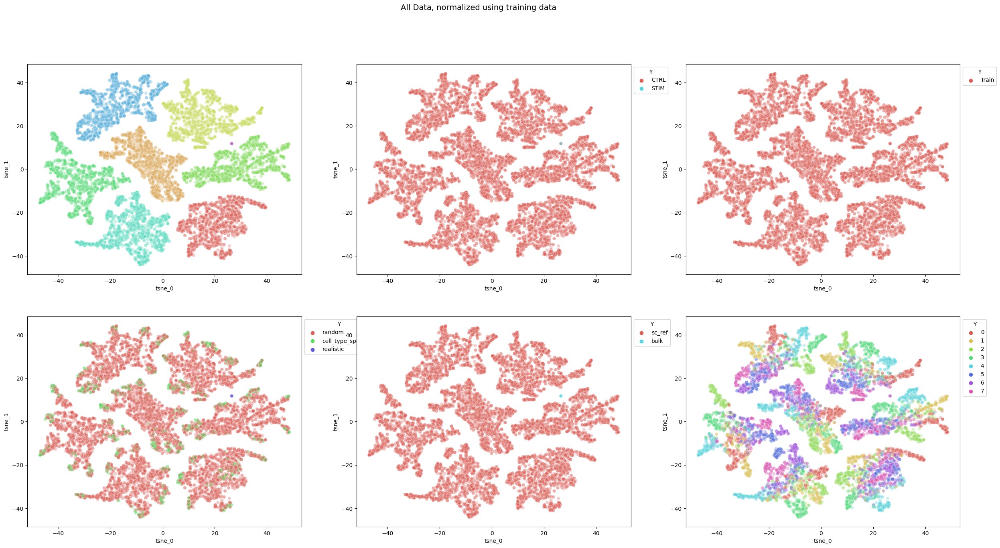

In [38]:
## plot samples
idx_tmp = np.random.choice(range(X_full.shape[0]), 10000, replace=True)


plot_df = vp.get_tsne_for_plotting(X_full[idx_tmp,])

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full.iloc[idx_tmp])
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].sample_id.to_numpy(), axs[0,0], title=f"")
vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].stim.to_numpy(), axs[0,1], title=f"")
vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].isTraining.to_numpy(), axs[0,2], title=f"")
vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].cell_prop_type.to_numpy(), axs[1,0], title=f"")
vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].samp_type.to_numpy(), axs[1,1], title=f"")
vp.plot_tsne(plot_df, Y_temp, axs[1,2], title=f"")


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


(32, 2)
(32, 2)


/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_78683/119314534.py:23: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


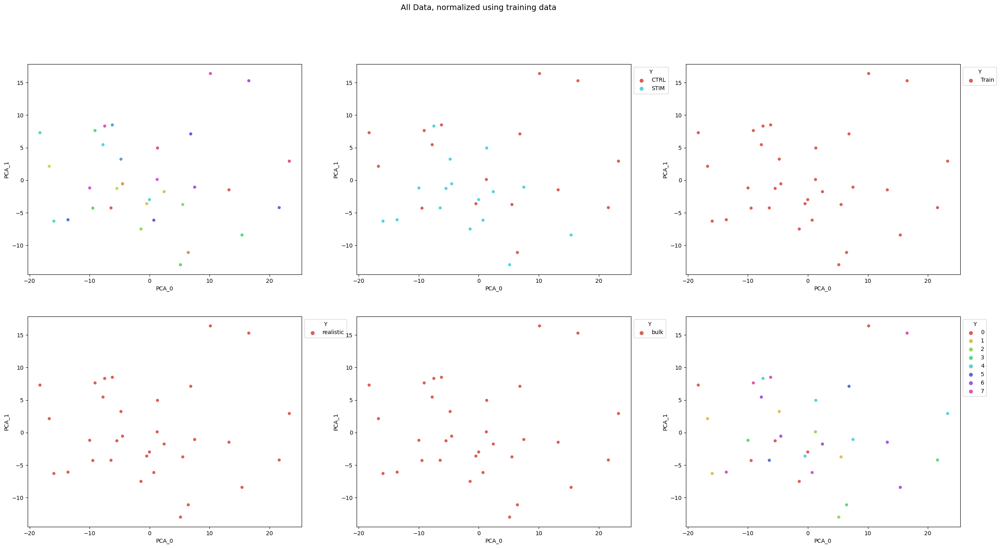

In [39]:
## plot samples
idx_interest = np.where(np.logical_and(meta_df.samp_type == "bulk", meta_df.isTraining == "Train"))[0]

plot_df = vp.get_pca_for_plotting(X_full[idx_interest])

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full.iloc[idx_interest])
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_pca(plot_df, meta_df.sample_id.to_numpy()[idx_interest], axs[0,0], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.stim.to_numpy()[idx_interest], axs[0,1], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.isTraining.to_numpy()[idx_interest], axs[0,2], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.cell_prop_type.to_numpy()[idx_interest], axs[1,0], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.samp_type.to_numpy()[idx_interest], axs[1,1], title=f"", alpha=1)
vp.plot_pca(plot_df, Y_temp, axs[1,2], title=f"", alpha=1)


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 32 samples in 0.001s...
[t-SNE] Computed neighbors for 32 samples in 0.002s...
[t-SNE] Computed conditional probabilities for sample 32 / 32
[t-SNE] Mean sigma: 13.369884
[t-SNE] KL divergence after 250 iterations with early exaggeration: 43.740921
[t-SNE] KL divergence after 500 iterations: 0.066505
(32, 2)
(32, 2)


/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_78683/614891228.py:23: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


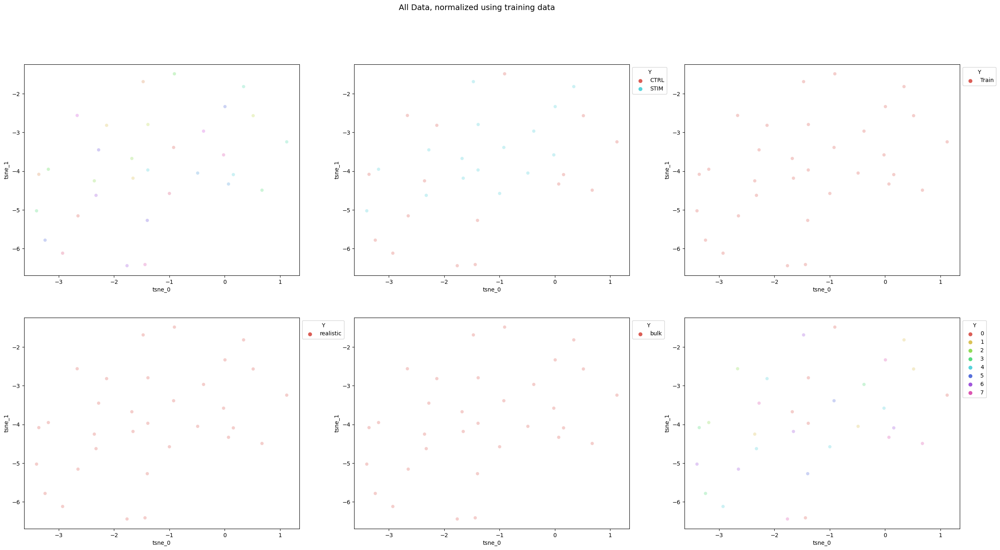

In [40]:
## plot samples
idx_interest = np.where(np.logical_and(meta_df.samp_type == "bulk", meta_df.isTraining == "Train"))[0]

plot_df = vp.get_tsne_for_plotting(X_full[idx_interest])

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full.iloc[idx_interest])
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_tsne(plot_df, meta_df.sample_id.to_numpy()[idx_interest], axs[0,0], title=f"")
vp.plot_tsne(plot_df, meta_df.stim.to_numpy()[idx_interest], axs[0,1], title=f"")
vp.plot_tsne(plot_df, meta_df.isTraining.to_numpy()[idx_interest], axs[0,2], title=f"")
vp.plot_tsne(plot_df, meta_df.cell_prop_type.to_numpy()[idx_interest], axs[1,0], title=f"")
vp.plot_tsne(plot_df, meta_df.samp_type.to_numpy()[idx_interest], axs[1,1], title=f"")
vp.plot_tsne(plot_df, Y_temp, axs[1,2], title=f"")


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


# **Run BuDDI**

## Hyperparameter Search

We are going to search over 2 parameters: 

1.  the weighting of the loss for the latent space classifications against the reconstruction (100, 1000, 10000)
2.  the number of epochs  (50, 100, 200)

2024-02-01 17:40:35.009860: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:375] MLIR V1 optimization pass is not enabled
2024-02-01 17:40:35.081945: W tensorflow/c/c_api.cc:304] Operation '{name:'sigma_rot/kernel/Assign' id:204 op device:{requested: '', assigned: ''} def:{{{node sigma_rot/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](sigma_rot/kernel, sigma_rot/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-01 17:40:35.321606: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack/truediv/y' id:387 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' wa

test_size_samp: 500
train_size_samp: 41000


2024-02-01 17:40:38.491429: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/drug_h2/bias/v/Assign' id:2471 op device:{requested: '', assigned: ''} def:{{{node training/Adam/drug_h2/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/drug_h2/bias/v, training/Adam/drug_h2/bias/v/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-01 17:40:39.434781: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_1/AddN' id:1183 op device:{requested: '', assigned: ''} def:{{{node loss_1/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_1/mul, loss_1/mul_1, loss_1/mul_2, loss_1/mul_3)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an er

Elapsed:  1957.6206102371216
Epoch:  49
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_toc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_toc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_toc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_toc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_toc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_toc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_toc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_toc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_toc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_toc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_toc-synovium_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_toc-synovium_classifier/assets


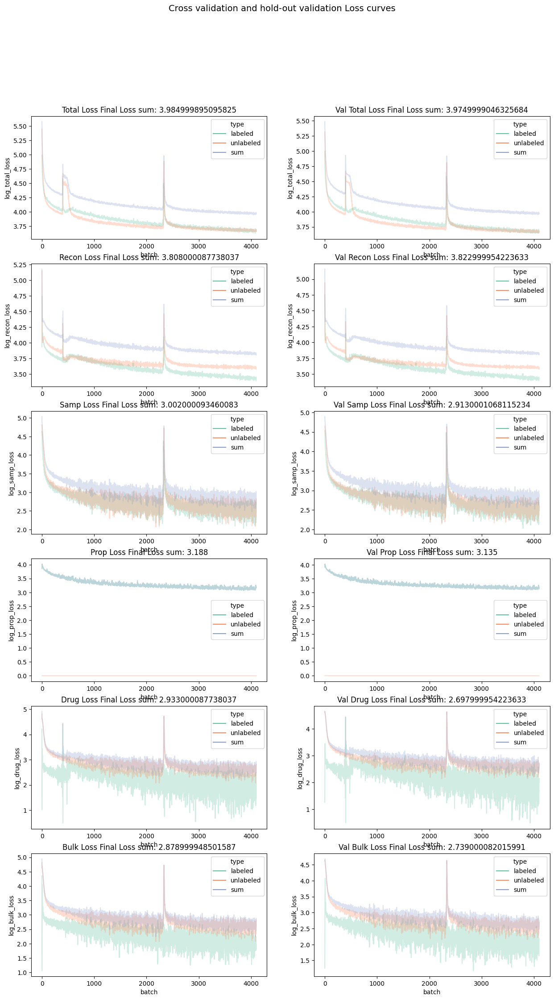

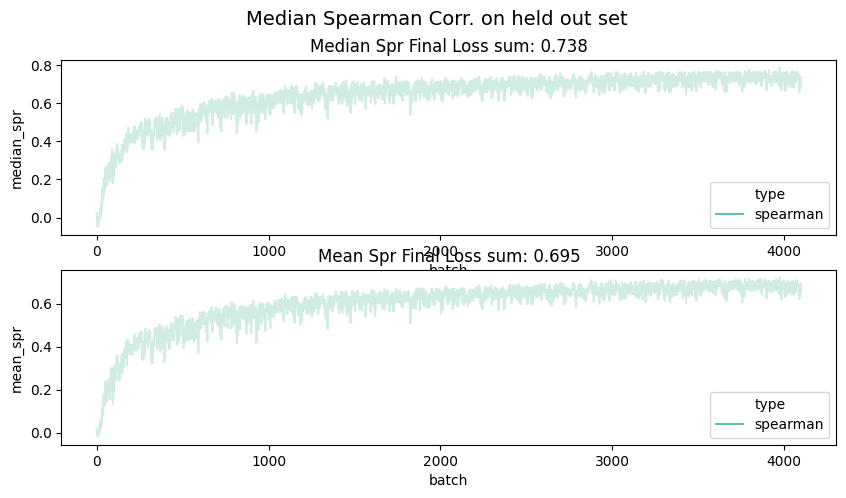

In [41]:
curr_n_epoch=50
curr_wt = 100
params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt*100, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt)

curr_res_id = f"{curr_n_epoch}_{curr_wt}_{res_id}"
res = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

### 50 1000

2024-02-01 18:13:24.127941: W tensorflow/c/c_api.cc:304] Operation '{name:'mu_slack_1/bias/Assign' id:5061 op device:{requested: '', assigned: ''} def:{{{node mu_slack_1/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](mu_slack_1/bias, mu_slack_1/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-01 18:13:24.406176: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_1/truediv/y' id:5308 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_1/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't

test_size_samp: 500
train_size_samp: 41000


2024-02-01 18:13:27.095860: W tensorflow/c/c_api.cc:304] Operation '{name:'training_4/Adam/bulk_h2_1/bias/v/Assign' id:7370 op device:{requested: '', assigned: ''} def:{{{node training_4/Adam/bulk_h2_1/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_4/Adam/bulk_h2_1/bias/v, training_4/Adam/bulk_h2_1/bias/v/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-01 18:13:28.385020: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_3/AddN' id:6104 op device:{requested: '', assigned: ''} def:{{{node loss_3/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_3/mul, loss_3/mul_1, loss_3/mul_2, loss_3/mul_3)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and wi

Elapsed:  2213.928186893463
Epoch:  49
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_toc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_toc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_toc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_toc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_toc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_toc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_toc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_toc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_toc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_toc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_toc-synovium_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_toc-synovium_classifier/assets


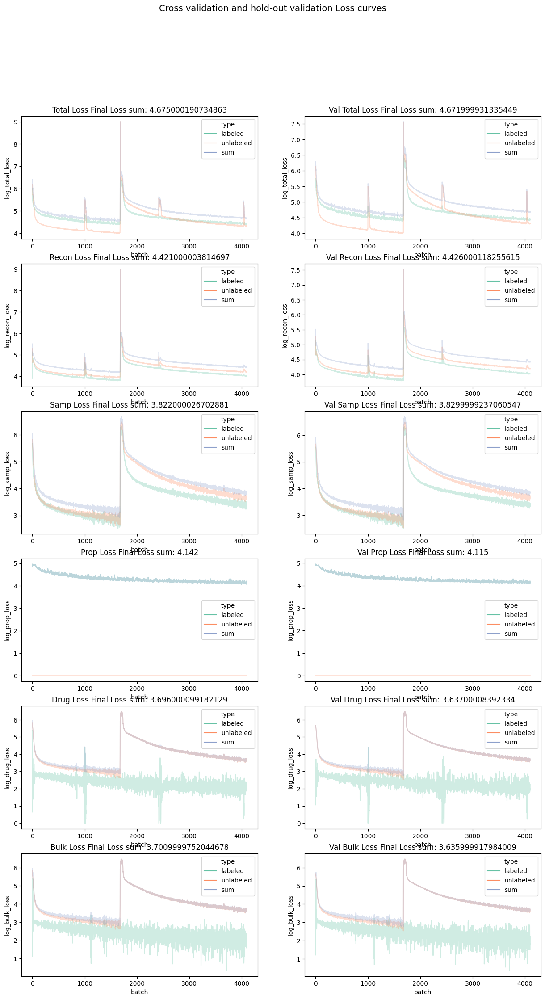

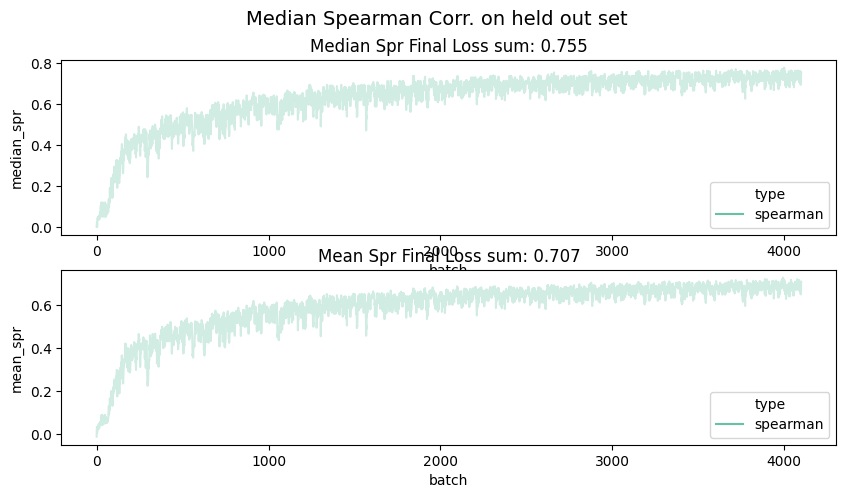

In [42]:
curr_n_epoch=50
curr_wt = 1000
params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt*100, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt)

curr_res_id = f"{curr_n_epoch}_{curr_wt}_{res_id}"
res = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)


### 50 10000

2024-02-01 18:50:31.200859: W tensorflow/c/c_api.cc:304] Operation '{name:'encoder_bulk_2/bias/Assign' id:9926 op device:{requested: '', assigned: ''} def:{{{node encoder_bulk_2/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](encoder_bulk_2/bias, encoder_bulk_2/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-01 18:50:31.594865: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_2/truediv/y' id:10197 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_2/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the fut

test_size_samp: 500
train_size_samp: 41000


2024-02-01 18:50:40.200845: W tensorflow/c/c_api.cc:304] Operation '{name:'training_8/Adam/mu_bulk_2/bias/m/Assign' id:11953 op device:{requested: '', assigned: ''} def:{{{node training_8/Adam/mu_bulk_2/bias/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_8/Adam/mu_bulk_2/bias/m, training_8/Adam/mu_bulk_2/bias/m/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-01 18:50:42.988677: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_5/AddN' id:10993 op device:{requested: '', assigned: ''} def:{{{node loss_5/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_5/mul, loss_5/mul_1, loss_5/mul_2, loss_5/mul_3)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and 

Elapsed:  2535.541221857071
Epoch:  49
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_toc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_toc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_toc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_toc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_toc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_toc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_toc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_toc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_toc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_toc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_toc-synovium_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_toc-synovium_classifier/assets


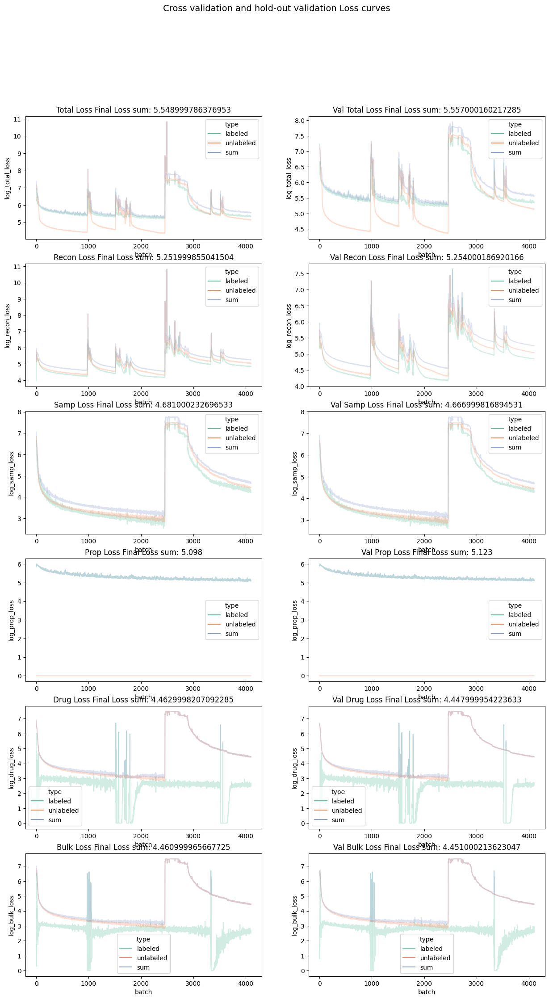

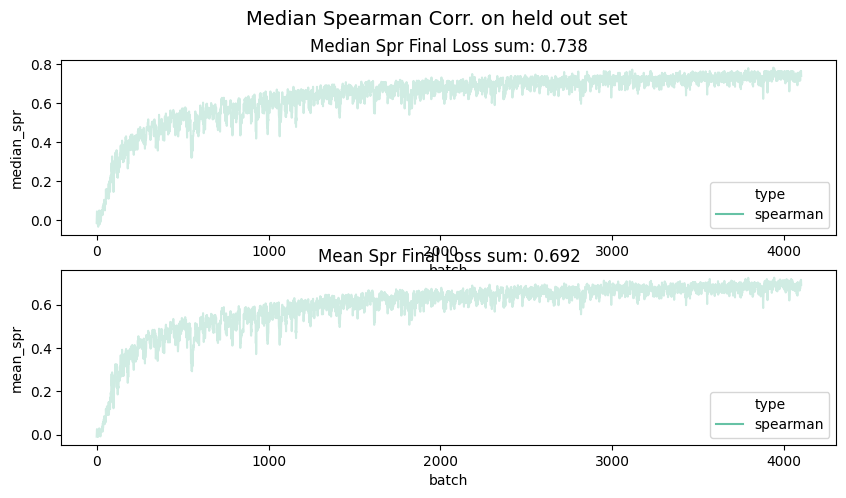

In [43]:
curr_n_epoch=50
curr_wt = 10000
params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt*100, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt)

curr_res_id = f"{curr_n_epoch}_{curr_wt}_{res_id}"
res = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

### 100 100

2024-02-01 19:33:00.489376: W tensorflow/c/c_api.cc:304] Operation '{name:'encoder_slack_3/bias/Assign' id:14743 op device:{requested: '', assigned: ''} def:{{{node encoder_slack_3/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](encoder_slack_3/bias, encoder_slack_3/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-01 19:33:00.924051: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_3/truediv/y' id:15086 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_3/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in th

test_size_samp: 500
train_size_samp: 41000


2024-02-01 19:33:09.014662: W tensorflow/c/c_api.cc:304] Operation '{name:'training_12/Adam/cls_out_3/kernel/v/Assign' id:17169 op device:{requested: '', assigned: ''} def:{{{node training_12/Adam/cls_out_3/kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_12/Adam/cls_out_3/kernel/v, training_12/Adam/cls_out_3/kernel/v/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-01 19:33:12.370611: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_7/AddN' id:15882 op device:{requested: '', assigned: ''} def:{{{node loss_7/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_7/mul, loss_7/mul_1, loss_7/mul_2, loss_7/mul_3)}}' was changed by setting attribute after it was run by a session. This mutation will have no 

Elapsed:  3977.7357330322266
Epoch:  99
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_toc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_toc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_toc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_toc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_toc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_toc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_toc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_toc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_toc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_toc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_toc-synovium_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_toc-synovium_classifier/assets


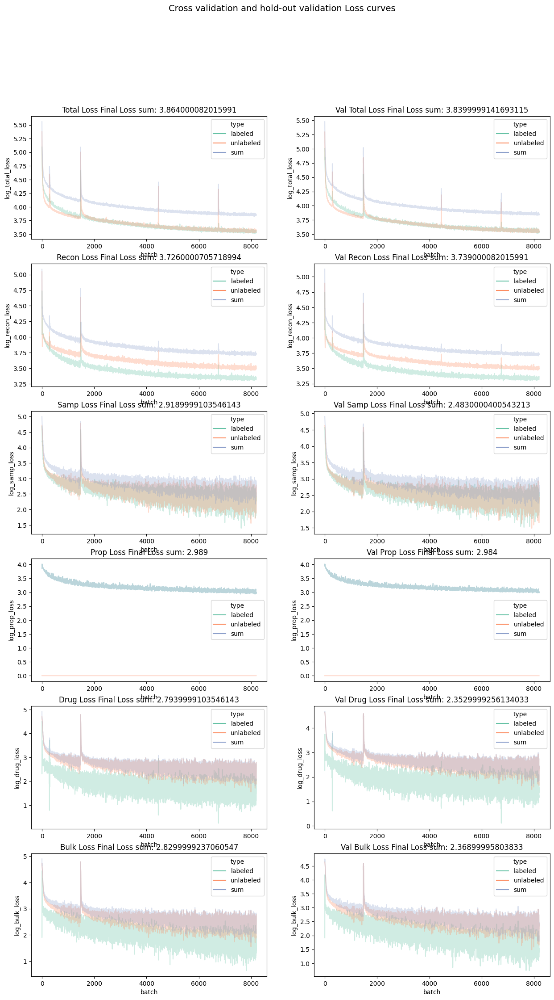

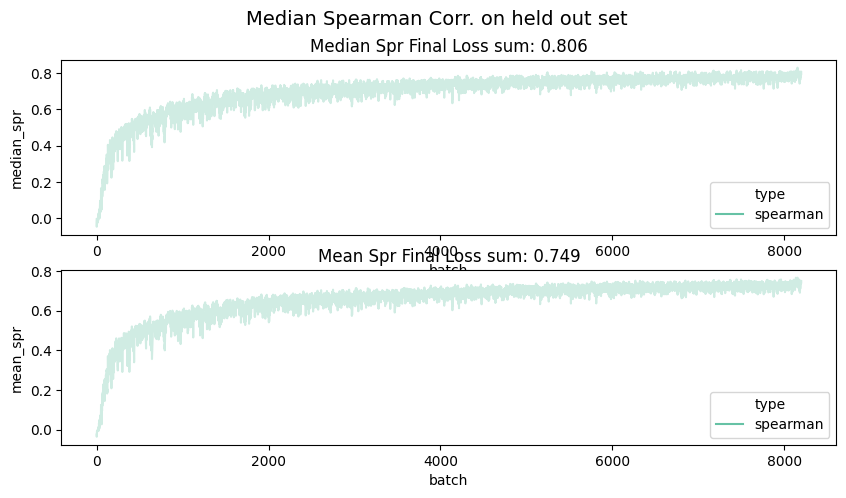

In [44]:
curr_n_epoch=100
curr_wt = 100
params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt*100, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt)

curr_res_id = f"{curr_n_epoch}_{curr_wt}_{res_id}"
res = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

### 100 1000

2024-02-01 20:39:33.875347: W tensorflow/c/c_api.cc:304] Operation '{name:'sigma_rot_4/bias/Assign' id:19797 op device:{requested: '', assigned: ''} def:{{{node sigma_rot_4/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](sigma_rot_4/bias, sigma_rot_4/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-01 20:39:34.349226: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_4/truediv/y' id:19975 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_4/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either

test_size_samp: 500
train_size_samp: 41000


2024-02-01 20:39:39.695397: W tensorflow/c/c_api.cc:304] Operation '{name:'count_43/Assign' id:20549 op device:{requested: '', assigned: ''} def:{{{node count_43/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](count_43, count_43/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-01 20:39:42.148567: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_9/AddN' id:20771 op device:{requested: '', assigned: ''} def:{{{node loss_9/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_9/mul, loss_9/mul_1, loss_9/mul_2, loss_9/mul_3)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a ne

Elapsed:  3908.5125091075897
Epoch:  99
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_toc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_toc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_toc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_toc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_toc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_toc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_toc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_toc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_toc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_toc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_toc-synovium_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_toc-synovium_classifier/assets


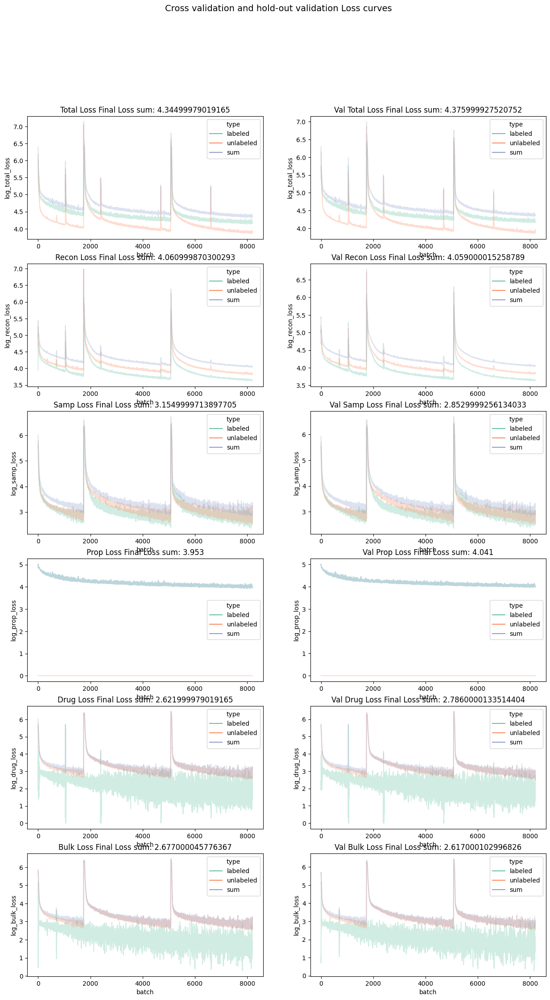

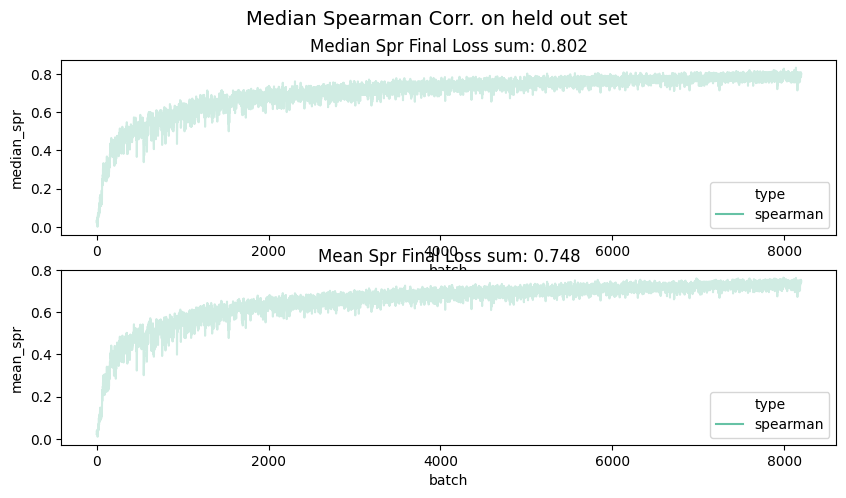

In [45]:
curr_n_epoch=100
curr_wt = 1000
params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt*100, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt)

curr_res_id = f"{curr_n_epoch}_{curr_wt}_{res_id}"
res = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

### 100 10000

2024-02-01 21:44:59.452511: W tensorflow/c/c_api.cc:304] Operation '{name:'mu_bulk_5/bias/Assign' id:24755 op device:{requested: '', assigned: ''} def:{{{node mu_bulk_5/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](mu_bulk_5/bias, mu_bulk_5/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-01 21:45:00.011070: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_5/truediv/y' id:24864 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_5/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't m

test_size_samp: 500
train_size_samp: 41000


2024-02-01 21:45:04.760798: W tensorflow/c/c_api.cc:304] Operation '{name:'training_20/Adam/mu_slack_5/kernel/m/Assign' id:26579 op device:{requested: '', assigned: ''} def:{{{node training_20/Adam/mu_slack_5/kernel/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_20/Adam/mu_slack_5/kernel/m, training_20/Adam/mu_slack_5/kernel/m/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-01 21:45:07.734962: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_11/AddN' id:25660 op device:{requested: '', assigned: ''} def:{{{node loss_11/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_11/mul, loss_11/mul_1, loss_11/mul_2, loss_11/mul_3)}}' was changed by setting attribute after it was run by a session. This mutation wil

Elapsed:  3891.278525829315
Epoch:  99
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_toc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_toc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_toc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_toc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_toc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_toc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_toc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_toc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_toc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_toc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_toc-synovium_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_toc-synovium_classifier/assets


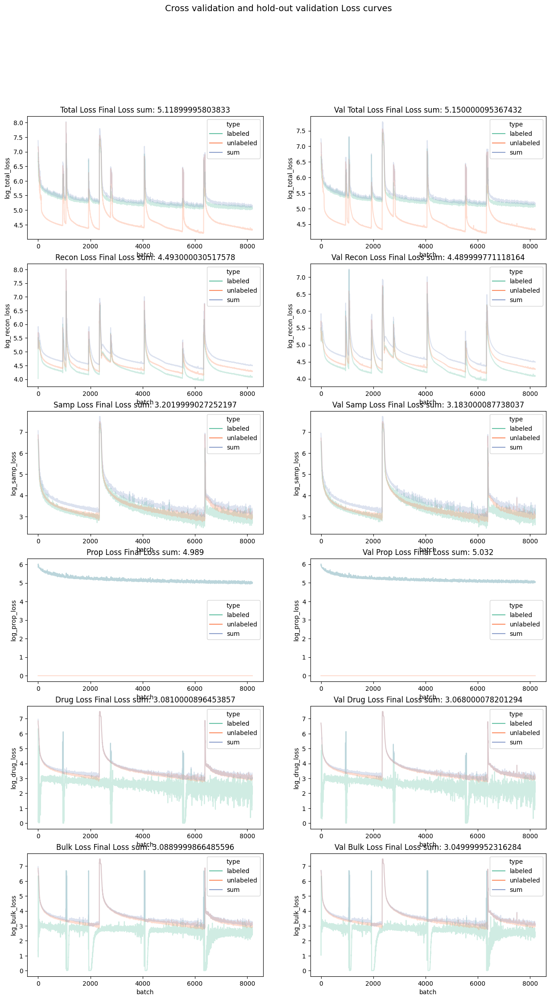

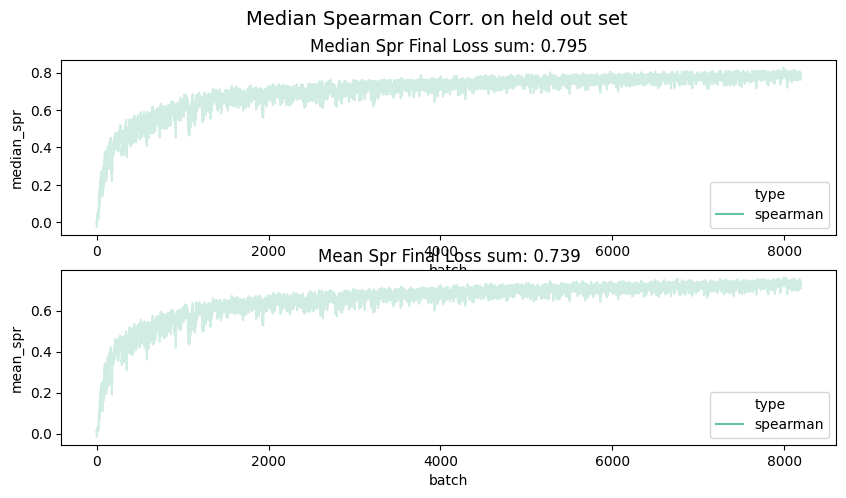

In [46]:
curr_n_epoch=100
curr_wt = 10000
params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt*100, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt)

curr_res_id = f"{curr_n_epoch}_{curr_wt}_{res_id}"
res = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

### 200 100

2024-02-01 22:50:08.155817: W tensorflow/c/c_api.cc:304] Operation '{name:'mu_drug_6/bias/Assign' id:29598 op device:{requested: '', assigned: ''} def:{{{node mu_drug_6/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](mu_drug_6/bias, mu_drug_6/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-01 22:50:08.776784: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_6/truediv/y' id:29753 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_6/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't m

test_size_samp: 500
train_size_samp: 41000


2024-02-01 22:50:14.007107: W tensorflow/c/c_api.cc:304] Operation '{name:'training_24/Adam/bulk_h2_6/kernel/m/Assign' id:31572 op device:{requested: '', assigned: ''} def:{{{node training_24/Adam/bulk_h2_6/kernel/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_24/Adam/bulk_h2_6/kernel/m, training_24/Adam/bulk_h2_6/kernel/m/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-01 22:50:17.293123: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_13/AddN' id:30549 op device:{requested: '', assigned: ''} def:{{{node loss_13/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_13/mul, loss_13/mul_1, loss_13/mul_2, loss_13/mul_3)}}' was changed by setting attribute after it was run by a session. This mutation will ha

Elapsed:  7815.951890230179
Epoch:  199
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_100_toc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_100_toc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_100_toc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_100_toc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_100_toc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_100_toc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_100_toc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_100_toc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_100_toc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_100_toc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_100_toc-synovium_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_100_toc-synovium_classifier/assets


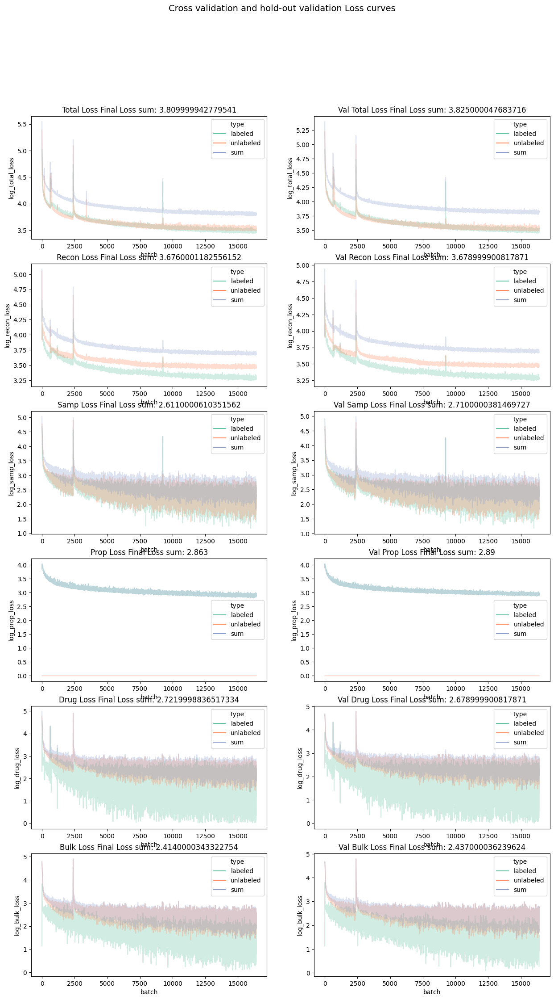

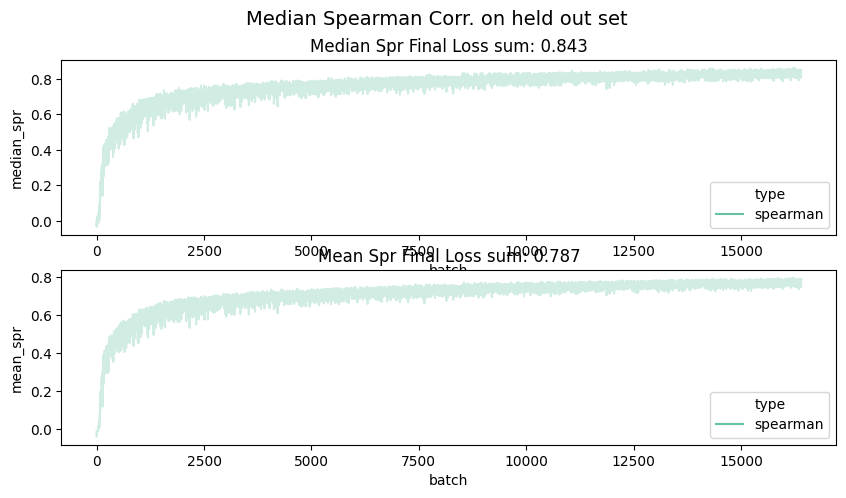

In [47]:
curr_n_epoch=200
curr_wt = 100
params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt*100, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt)

curr_res_id = f"{curr_n_epoch}_{curr_wt}_{res_id}"
res = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

### 200 1000

2024-02-02 01:00:47.265288: W tensorflow/c/c_api.cc:304] Operation '{name:'mu_bulk_7/bias/Assign' id:34533 op device:{requested: '', assigned: ''} def:{{{node mu_bulk_7/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](mu_bulk_7/bias, mu_bulk_7/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-02 01:00:47.978334: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_7/truediv/y' id:34642 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_7/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't m

test_size_samp: 500
train_size_samp: 41000


2024-02-02 01:00:54.125976: W tensorflow/c/c_api.cc:304] Operation '{name:'training_28/Adam/sigma_slack_7/bias/m/Assign' id:36314 op device:{requested: '', assigned: ''} def:{{{node training_28/Adam/sigma_slack_7/bias/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_28/Adam/sigma_slack_7/bias/m, training_28/Adam/sigma_slack_7/bias/m/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-02 01:00:58.253948: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_15/AddN' id:35438 op device:{requested: '', assigned: ''} def:{{{node loss_15/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_15/mul, loss_15/mul_1, loss_15/mul_2, loss_15/mul_3)}}' was changed by setting attribute after it was run by a session. This mutation

Elapsed:  7831.087132930756
Epoch:  199
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_toc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_toc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_toc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_toc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_toc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_toc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_toc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_toc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_toc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_toc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_toc-synovium_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_toc-synovium_classifier/assets


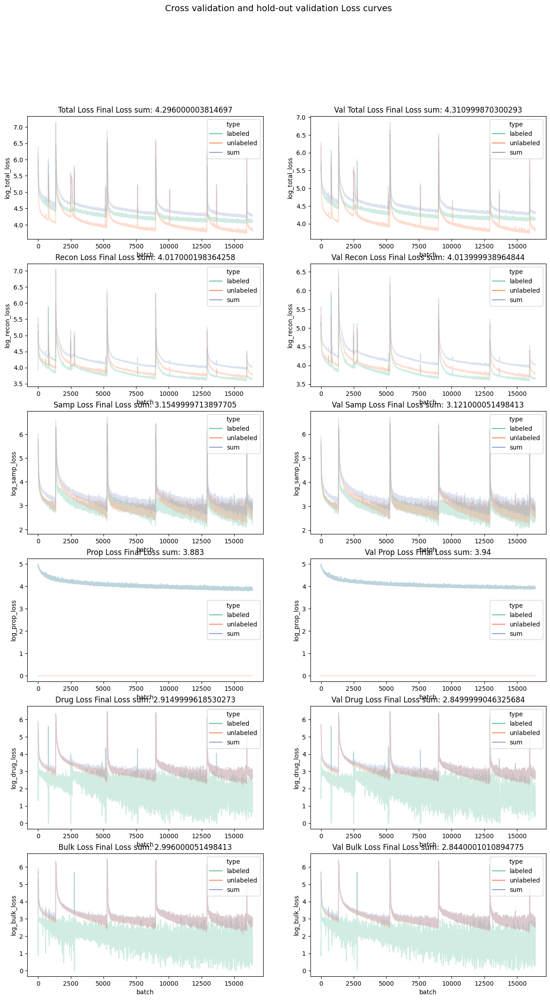

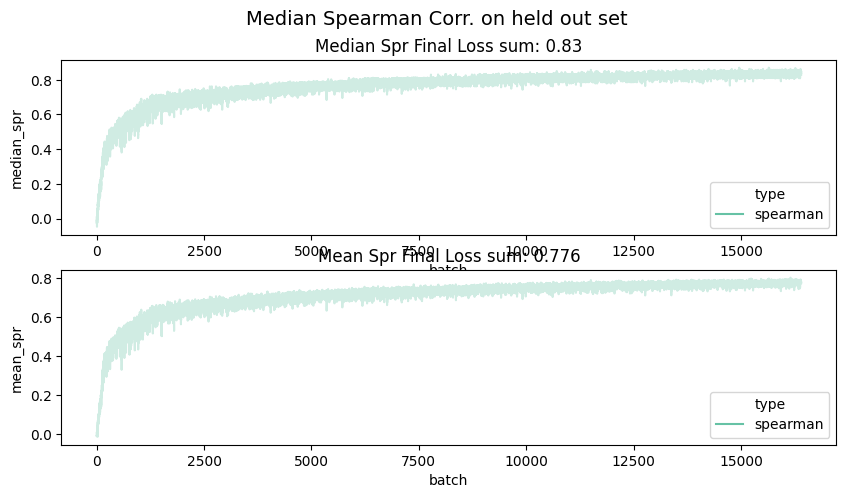

In [48]:
curr_n_epoch=200
curr_wt = 1000
params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt*100, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt)

curr_res_id = f"{curr_n_epoch}_{curr_wt}_{res_id}"
res = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

### 200 10000

2024-02-02 03:11:43.055538: W tensorflow/c/c_api.cc:304] Operation '{name:'sigma_rot_8/bias/Assign' id:39353 op device:{requested: '', assigned: ''} def:{{{node sigma_rot_8/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](sigma_rot_8/bias, sigma_rot_8/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-02 03:11:43.837299: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_8/truediv/y' id:39531 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_8/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either

test_size_samp: 500
train_size_samp: 41000


2024-02-02 03:11:50.600622: W tensorflow/c/c_api.cc:304] Operation '{name:'training_32/Adam/cls_out_8/bias/m/Assign' id:41381 op device:{requested: '', assigned: ''} def:{{{node training_32/Adam/cls_out_8/bias/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_32/Adam/cls_out_8/bias/m, training_32/Adam/cls_out_8/bias/m/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-02 03:11:55.137317: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_17/AddN' id:40327 op device:{requested: '', assigned: ''} def:{{{node loss_17/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_17/mul, loss_17/mul_1, loss_17/mul_2, loss_17/mul_3)}}' was changed by setting attribute after it was run by a session. This mutation will have no ef

Elapsed:  7862.144381761551
Epoch:  199
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_toc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_toc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_toc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_toc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_toc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_toc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_toc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_toc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_toc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_toc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_toc-synovium_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_toc-synovium_classifier/assets


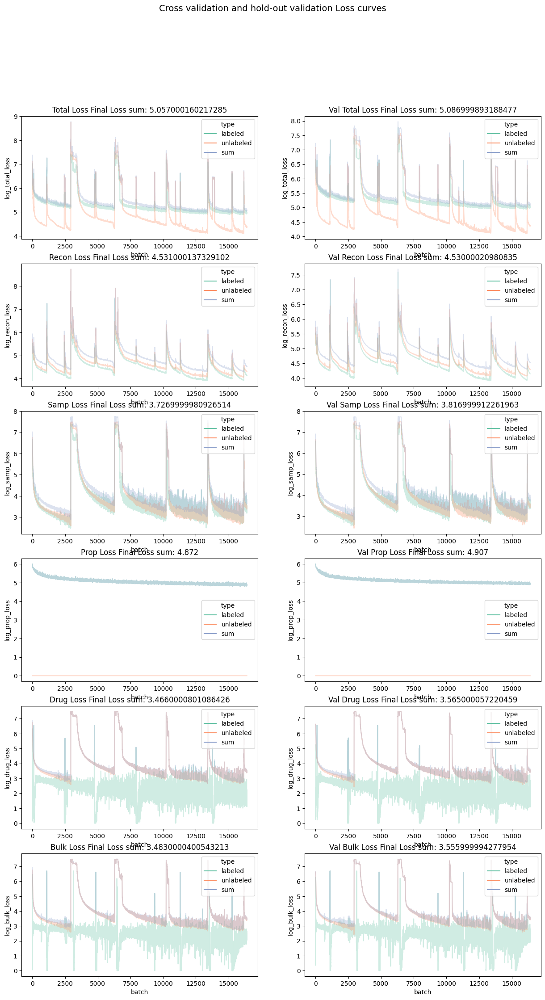

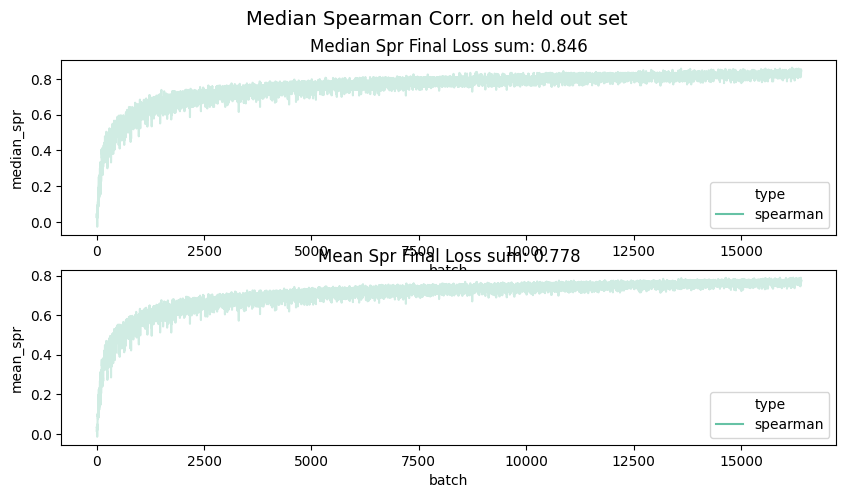

In [49]:
curr_n_epoch=200
curr_wt = 10000
params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt*100, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt)

curr_res_id = f"{curr_n_epoch}_{curr_wt}_{res_id}"
res = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

In [50]:
res

BuddiTrainResults(known_prop_vae=<keras.src.engine.functional.Functional object at 0x978303310>, unknown_prop_vae=<keras.src.engine.functional.Functional object at 0x978301210>, encoder_unlab=<keras.src.engine.functional.Functional object at 0x978301f60>, encoder_lab=<keras.src.engine.functional.Functional object at 0x29f30aa40>, decoder=<keras.src.engine.functional.Functional object at 0x29f3095d0>, classifier=<keras.src.engine.functional.Functional object at 0x978302e30>, loss_fig=<Figure size 1500x2500 with 12 Axes>, spr_fig=<Figure size 1000x500 with 2 Axes>, output_folder='/Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium/')

# **Results**

Looking at all the results, we see that 200 epochs and weight of 100 gets the lowest reconstruction error and performs reasonably well in estimating the cell-type proportions.

**log10 reconstruction error:**

| Weight | 50 epochs | 100 epochs | 200 epochs |
| :---: | :---: | :---: | :---: |
| 100 | 3.49 | 3.45 | **3.25** |
| 1000 | 3.94 | 3.83 | 3.59 |
| 10000 | 4.30 | 4.38 | 5.07 |


**spearman error:**

| Weight | 50 epochs | 100 epochs | 200 epochs |
| :---: | :---: | :---: | :---: |
| 100 | 0.69 | 0.71 | 0.76 |
| 1000 | 0.655 | 0.71 | **0.77** |
| 10000 | 0.654 | 0.38 | 0.76 |


2024-02-02 05:23:10.482755: W tensorflow/c/c_api.cc:304] Operation '{name:'cls_h2_9/kernel/Assign' id:44376 op device:{requested: '', assigned: ''} def:{{{node cls_h2_9/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](cls_h2_9/kernel, cls_h2_9/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-02 05:23:11.338722: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_9/truediv/y' id:44420 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_9/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the

test_size_samp: 500
train_size_samp: 41000


2024-02-02 05:23:19.976113: W tensorflow/c/c_api.cc:304] Operation '{name:'training_36/Adam/cls_out_9/kernel/m/Assign' id:46265 op device:{requested: '', assigned: ''} def:{{{node training_36/Adam/cls_out_9/kernel/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_36/Adam/cls_out_9/kernel/m, training_36/Adam/cls_out_9/kernel/m/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-02 05:23:25.301398: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_19/AddN' id:45216 op device:{requested: '', assigned: ''} def:{{{node loss_19/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_19/mul, loss_19/mul_1, loss_19/mul_2, loss_19/mul_3)}}' was changed by setting attribute after it was run by a session. This mutation will ha

Elapsed:  7877.148266077042
Epoch:  199
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model1_toc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model1_toc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model1_toc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model1_toc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model1_toc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model1_toc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model1_toc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model1_toc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model1_toc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model1_toc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model1_toc-synovium_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model1_toc-synovium_classifier/assets


2024-02-02 07:34:52.880047: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_199' id:49216 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_199}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_7, Identity_6239)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-02-02 07:34:54.630333: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_212' id:49577 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_212}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_14, Identity_6252)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-02-02 07:34:56.032894: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_231' id:49761 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_231}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_25, Identity_6271)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-02-02 07:34:57.392965: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_235' id:49846 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_235}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_27, Identity_6275)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


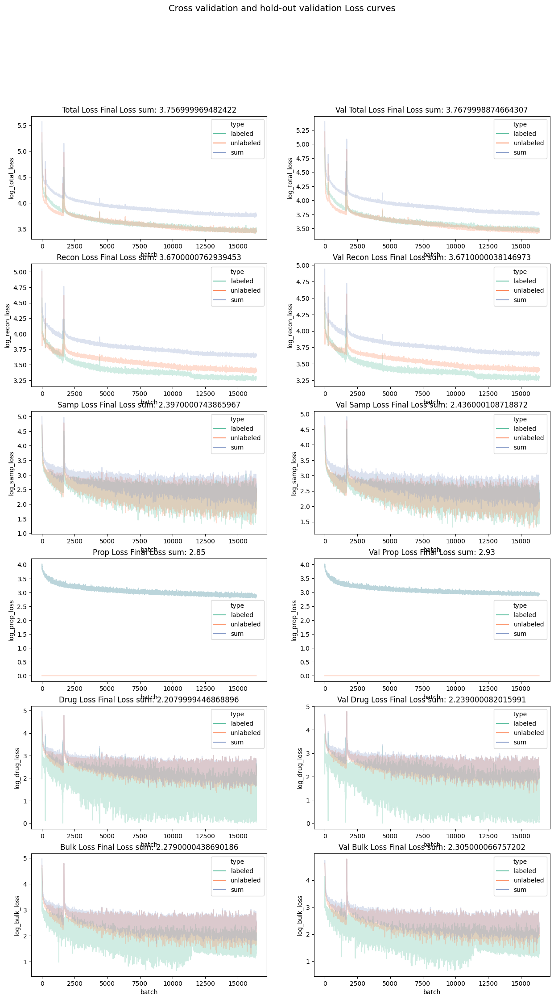

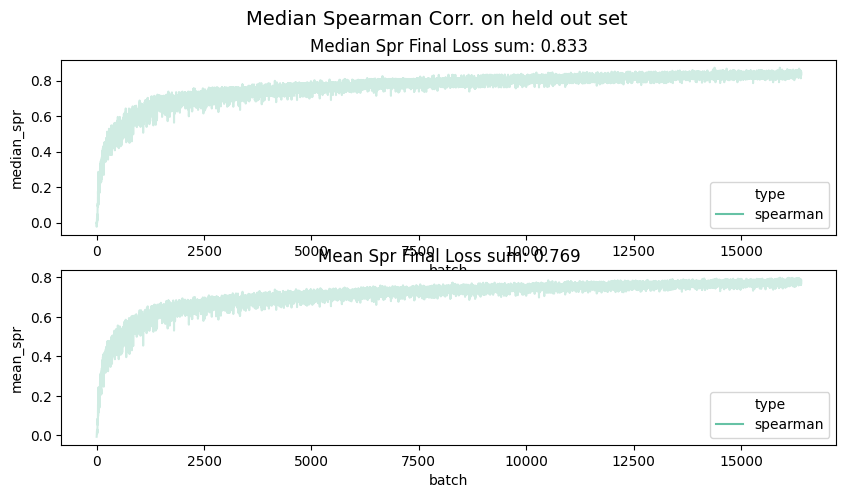

In [51]:
curr_n_epoch=200
curr_wt = 100

params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt*100, alpha_prop=curr_wt,
            alpha_bulk=curr_wt, alpha_drug=curr_wt)#, n_label_z=10,
            #encoder_dim=32, decoder_dim=32)

## model 1
curr_res_id = f"model1_{res_id}"
res1 = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)


res1_enc_unlab = tf.keras.models.load_model(f"{res_data_path}/600_model1_{res_id}_encoder_unlab")
res1_enc_lab = tf.keras.models.load_model(f"{res_data_path}/600_model1_{res_id}_encoder_lab")
res1_dec = tf.keras.models.load_model(f"{res_data_path}/600_model1_{res_id}_decoder")
res1_classifier = tf.keras.models.load_model(f"{res_data_path}/600_model1_{res_id}_classifier")



2024-02-02 07:35:00.709813: W tensorflow/c/c_api.cc:304] Operation '{name:'encoder_bulk_12/kernel/Assign' id:49962 op device:{requested: '', assigned: ''} def:{{{node encoder_bulk_12/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](encoder_bulk_12/kernel, encoder_bulk_12/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-02 07:35:01.700650: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_10/truediv/y' id:50238 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_10/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, an

test_size_samp: 500
train_size_samp: 41000


2024-02-02 07:35:12.350063: W tensorflow/c/c_api.cc:304] Operation '{name:'training_40/Adam/mu_bulk_12/kernel/v/Assign' id:52227 op device:{requested: '', assigned: ''} def:{{{node training_40/Adam/mu_bulk_12/kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_40/Adam/mu_bulk_12/kernel/v, training_40/Adam/mu_bulk_12/kernel/v/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-02 07:35:18.252527: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_21/AddN' id:51034 op device:{requested: '', assigned: ''} def:{{{node loss_21/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_21/mul, loss_21/mul_1, loss_21/mul_2, loss_21/mul_3)}}' was changed by setting attribute after it was run by a session. This mutation wil

Elapsed:  8066.592157363892
Epoch:  199
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model2_toc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model2_toc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model2_toc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model2_toc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model2_toc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model2_toc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model2_toc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model2_toc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model2_toc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model2_toc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model2_toc-synovium_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model2_toc-synovium_classifier/assets


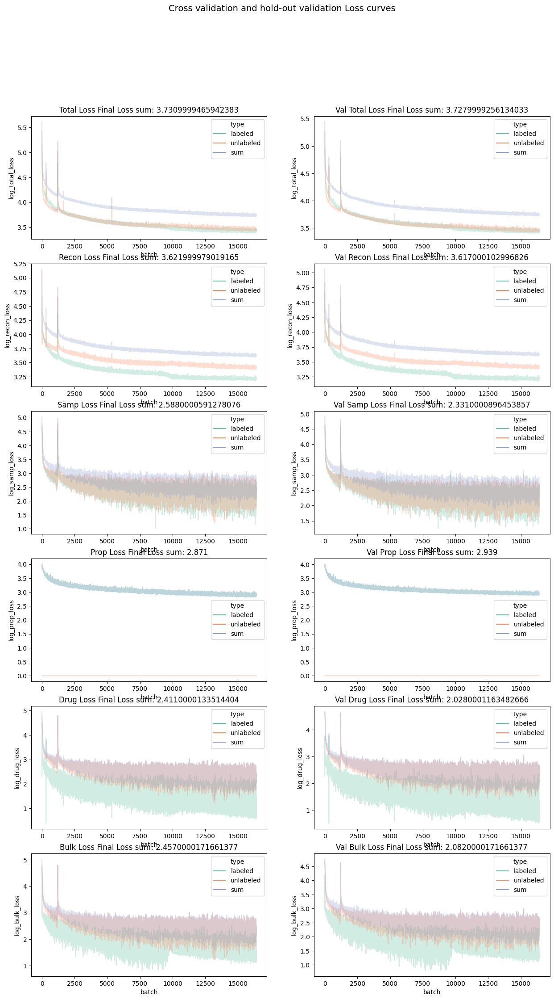

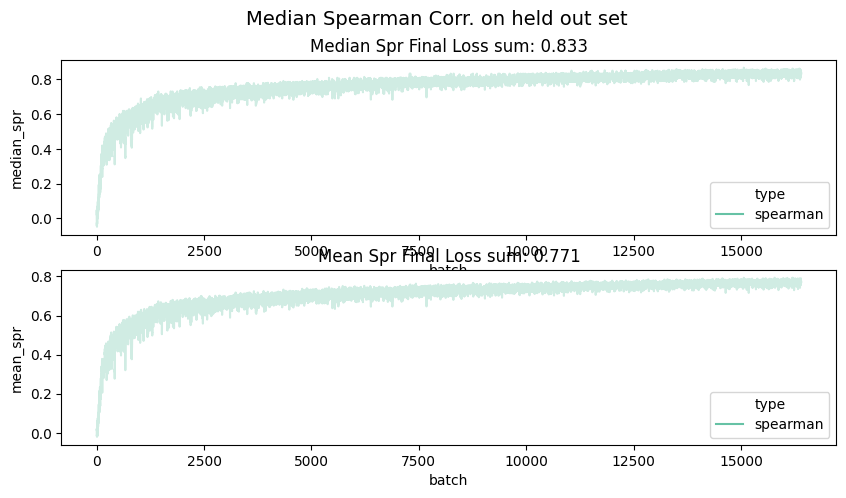

In [52]:
curr_n_epoch=200
curr_wt = 100
model_num = 2

params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt*100, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt)

## model 2
curr_res_id = f"model{model_num}_{res_id}"
res2 = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)


2024-02-02 09:49:56.333282: W tensorflow/c/c_api.cc:304] Operation '{name:'mu_bulk_13/bias/Assign' id:55018 op device:{requested: '', assigned: ''} def:{{{node mu_bulk_13/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](mu_bulk_13/bias, mu_bulk_13/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-02 09:49:57.413385: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_11/truediv/y' id:55127 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_11/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either d

test_size_samp: 500
train_size_samp: 41000


2024-02-02 09:50:11.790840: W tensorflow/c/c_api.cc:304] Operation '{name:'training_44/Adam/mu_bulk_13/kernel/v/Assign' id:57116 op device:{requested: '', assigned: ''} def:{{{node training_44/Adam/mu_bulk_13/kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_44/Adam/mu_bulk_13/kernel/v, training_44/Adam/mu_bulk_13/kernel/v/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-02 09:50:17.759703: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_23/AddN' id:55923 op device:{requested: '', assigned: ''} def:{{{node loss_23/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_23/mul, loss_23/mul_1, loss_23/mul_2, loss_23/mul_3)}}' was changed by setting attribute after it was run by a session. This mutation wil

Elapsed:  4012.5496051311493
Epoch:  99
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model3_toc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model3_toc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model3_toc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model3_toc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model3_toc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model3_toc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model3_toc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model3_toc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model3_toc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model3_toc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model3_toc-synovium_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model3_toc-synovium_classifier/assets


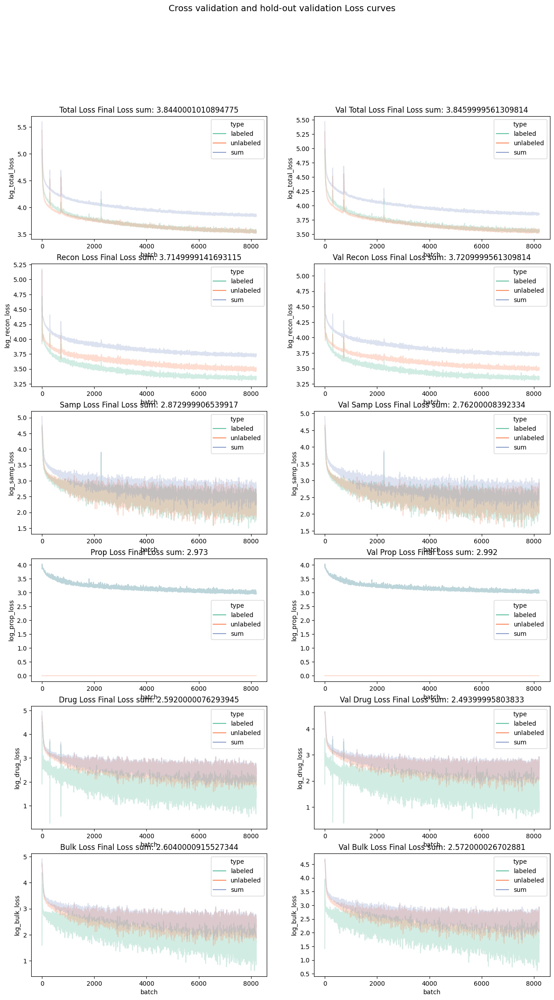

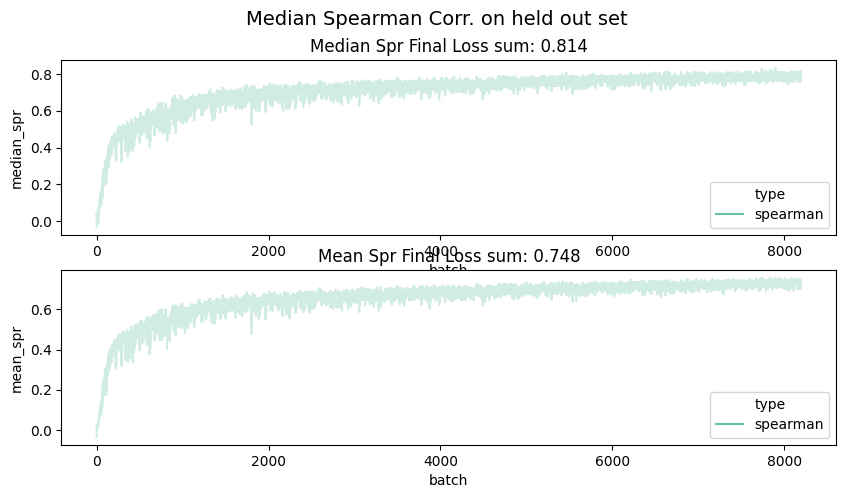

In [53]:

## model 3
curr_n_epoch=100
curr_wt = 100
model_num = 3
params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt*100, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt)

curr_res_id = f"model{model_num}_{res_id}"
res3 = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)



2024-02-02 11:25:36.337045: W tensorflow/c/c_api.cc:304] Operation '{name:'sigma_bulk_20/bias/Assign' id:62726 op device:{requested: '', assigned: ''} def:{{{node sigma_bulk_20/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](sigma_bulk_20/bias, sigma_bulk_20/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-02 11:25:37.912519: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_12/truediv/y' id:62812 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_12/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the futu

test_size_samp: 500
train_size_samp: 41000


2024-02-02 11:25:54.866143: W tensorflow/c/c_api.cc:304] Operation '{name:'count_110/Assign' id:63081 op device:{requested: '', assigned: ''} def:{{{node count_110/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](count_110, count_110/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-02 11:26:02.023970: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_25/AddN' id:63608 op device:{requested: '', assigned: ''} def:{{{node loss_25/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_25/mul, loss_25/mul_1, loss_25/mul_2, loss_25/mul_3)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or c

Elapsed:  8088.2090928554535
Epoch:  199
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model1_toc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model1_toc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model1_toc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model1_toc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model1_toc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model1_toc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model1_toc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model1_toc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model1_toc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model1_toc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model1_toc-synovium_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model1_toc-synovium_classifier/assets
2024-02-02 13:40:59.327860: W tensorflow/c/c_api.cc:304] Operation '{name:'mu_slack_21/bias/Assign' id:67454 op device:{requested: '', assigned: ''} def:{{{node mu_slack_21/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](mu_slack_21/bias, mu_slack_21/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-02 13:41:00.714438: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_13/truediv/y' id:67701 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_13/truediv/y}} = Const[_has_manual_control_dependencies=true, dtyp

test_size_samp: 500
train_size_samp: 41000


2024-02-02 13:41:18.807291: W tensorflow/c/c_api.cc:304] Operation '{name:'training_52/Adam/encoder_bulk_21/kernel/m/Assign' id:69356 op device:{requested: '', assigned: ''} def:{{{node training_52/Adam/encoder_bulk_21/kernel/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_52/Adam/encoder_bulk_21/kernel/m, training_52/Adam/encoder_bulk_21/kernel/m/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-02 13:41:26.179229: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_27/AddN' id:68497 op device:{requested: '', assigned: ''} def:{{{node loss_27/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_27/mul, loss_27/mul_1, loss_27/mul_2, loss_27/mul_3)}}' was changed by setting attribute after it was run by a sessio

Elapsed:  7995.416475057602
Epoch:  199
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model2_toc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model2_toc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model2_toc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model2_toc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model2_toc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model2_toc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model2_toc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model2_toc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model2_toc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model2_toc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model2_toc-synovium_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model2_toc-synovium_classifier/assets
2024-02-02 15:54:49.212056: W tensorflow/c/c_api.cc:304] Operation '{name:'encoder_drug_22/bias/Assign' id:72295 op device:{requested: '', assigned: ''} def:{{{node encoder_drug_22/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](encoder_drug_22/bias, encoder_drug_22/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-02 15:54:50.790635: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_14/truediv/y' id:72590 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_14/truediv/y}} = Const[_has_manual_control_depende

test_size_samp: 500
train_size_samp: 41000


2024-02-02 15:55:08.566049: W tensorflow/c/c_api.cc:304] Operation '{name:'training_56/Adam/cls_h1_18/bias/m/Assign' id:74358 op device:{requested: '', assigned: ''} def:{{{node training_56/Adam/cls_h1_18/bias/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_56/Adam/cls_h1_18/bias/m, training_56/Adam/cls_h1_18/bias/m/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-02 15:55:17.275669: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_29/AddN' id:73386 op device:{requested: '', assigned: ''} def:{{{node loss_29/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_29/mul, loss_29/mul_1, loss_29/mul_2, loss_29/mul_3)}}' was changed by setting attribute after it was run by a session. This mutation will have no ef

Elapsed:  8098.568086862564
Epoch:  199
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model3_toc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model3_toc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model3_toc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model3_toc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model3_toc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model3_toc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model3_toc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model3_toc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model3_toc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model3_toc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model3_toc-synovium_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//model3_toc-synovium_classifier/assets


2024-02-02 18:10:21.416566: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_511' id:77366 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_511}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_118, Identity_9571)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-02-02 18:10:24.175053: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_531' id:77741 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_531}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_138, Identity_9591)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-02-02 18:10:26.524876: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_550' id:77925 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_550}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_140, Identity_9610)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-02-02 18:10:31.423157: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_554' id:78010 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_554}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_142, Identity_9614)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-02-02 18:10:34.752279: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_573' id:78303 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_573}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_149, Identity_9633)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-02-02 18:10:37.969480: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_598' id:78688 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_598}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_162, Identity_9658)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-02-02 18:10:40.568645: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_609' id:78856 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_609}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_169, Identity_9669)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-02-02 18:10:43.217321: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_613' id:78941 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_613}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_171, Identity_9673)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-02-02 18:10:46.441321: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_632' id:79234 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_632}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_179, Identity_9692)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-02-02 18:10:49.836850: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_657' id:79619 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_657}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_191, Identity_9717)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-02-02 18:10:52.676173: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_666' id:79783 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_666}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_198, Identity_9726)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-02-02 18:10:55.397877: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_674' id:79876 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_674}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_202, Identity_9734)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


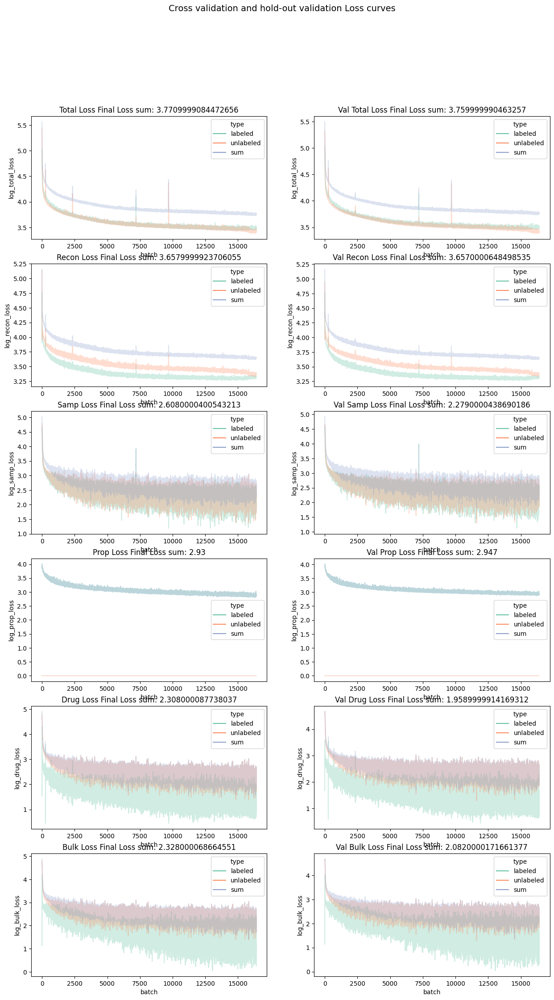

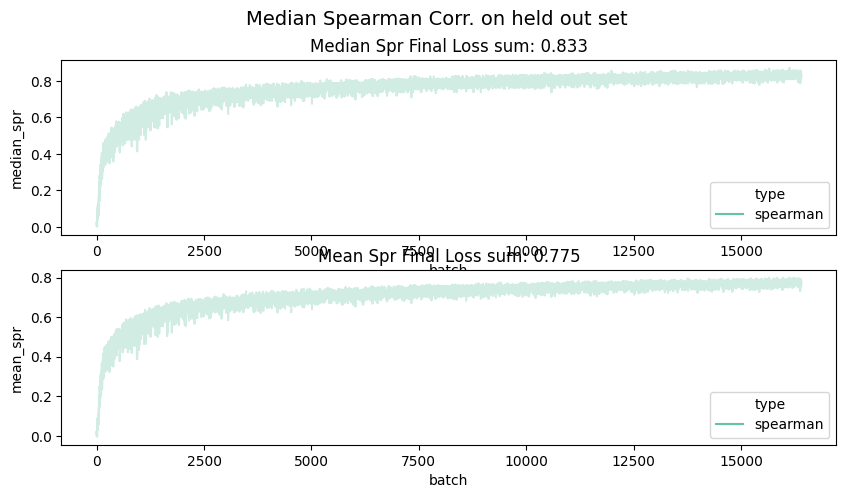

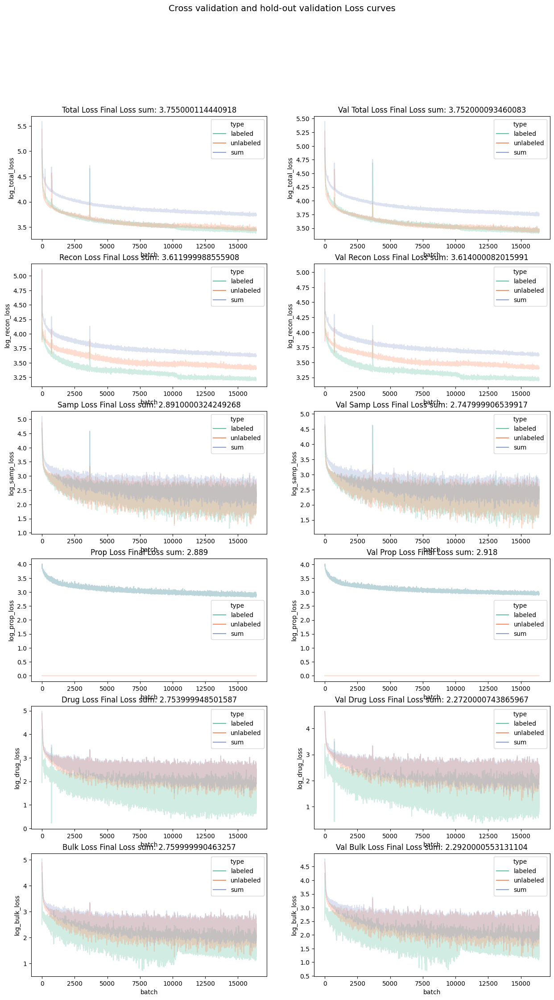

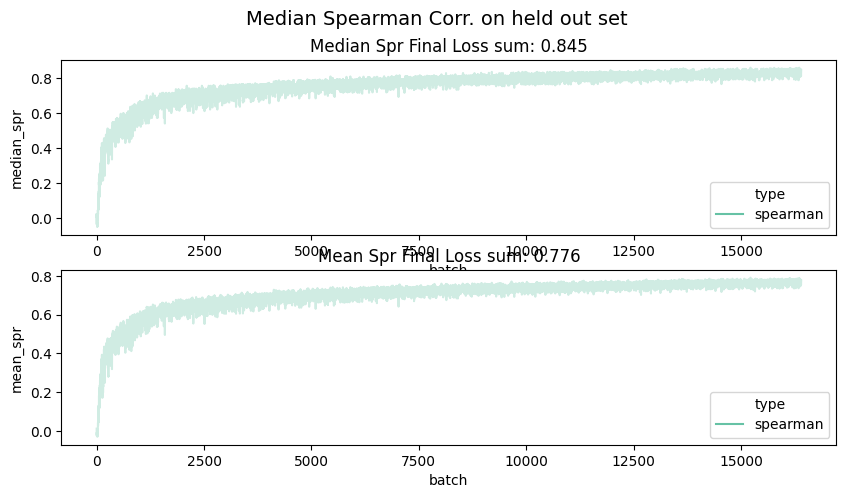

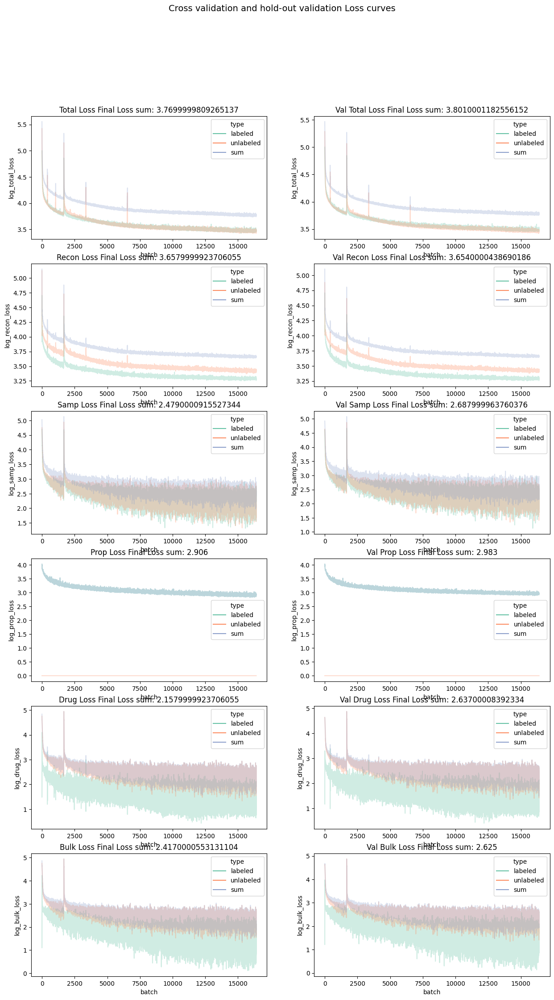

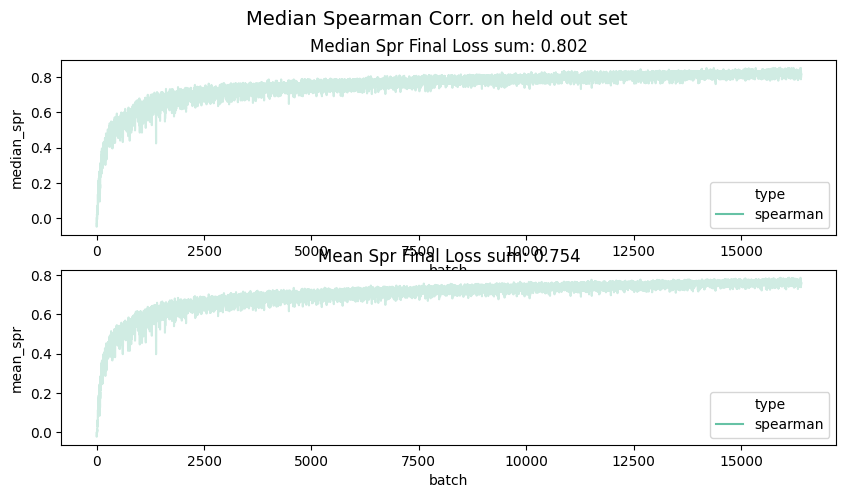

In [64]:
curr_n_epoch=200
curr_wt = 100

if RETRAIN_MODELS: # RETRAIN_MODELS


    params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
                alpha_rot=curr_wt*100, alpha_prop=curr_wt, 
                alpha_bulk=curr_wt, alpha_drug=curr_wt)

    ## model 1
    curr_res_id = f"model1_{res_id}"
    res1 = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
                n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
                X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
                X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

    ## model 2
    curr_res_id = f"model2_{res_id}"
    res2 = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
                n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
                X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
                X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

    ## model 3
    curr_res_id = f"model3_{res_id}"
    res3 = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
                n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
                X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
                X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)


res1_enc_unlab = tf.keras.models.load_model(f"{res_data_path}/model1_{res_id}_encoder_unlab")
res1_enc_lab = tf.keras.models.load_model(f"{res_data_path}/model1_{res_id}_encoder_lab")
res1_dec = tf.keras.models.load_model(f"{res_data_path}/model1_{res_id}_decoder")
res1_classifier = tf.keras.models.load_model(f"{res_data_path}/model1_{res_id}_classifier")


res2_enc_unlab = tf.keras.models.load_model(f"{res_data_path}/model2_{res_id}_encoder_unlab")
res2_enc_lab = tf.keras.models.load_model(f"{res_data_path}/model2_{res_id}_encoder_lab")
res2_dec = tf.keras.models.load_model(f"{res_data_path}/model2_{res_id}_decoder")
res2_classifier = tf.keras.models.load_model(f"{res_data_path}/model2_{res_id}_classifier")


res3_enc_unlab = tf.keras.models.load_model(f"{res_data_path}/model3_{res_id}_encoder_unlab")
res3_enc_lab = tf.keras.models.load_model(f"{res_data_path}/model3_{res_id}_encoder_lab")
res3_dec = tf.keras.models.load_model(f"{res_data_path}/model3_{res_id}_decoder")
res3_classifier = tf.keras.models.load_model(f"{res_data_path}/model3_{res_id}_classifier")

## visualize latent spaces

### subset data

In [65]:
# subset the data to the training data
# to show our latent spaces are learning appropriately

idx_tmp_bulk = np.where(np.logical_and(meta_df.isTraining == "Train", meta_df.cell_prop_type == "realistic"))[0]
idx_tmp_bulk = np.random.choice(idx_tmp_bulk, 5000, replace=True)


idx_tmp = np.where(np.logical_and(meta_df.isTraining == "Train", meta_df.cell_prop_type != "realistic"))[0]
idx_tmp = np.random.choice(idx_tmp, 5000, replace=True)
idx_tmp = np.concatenate((idx_tmp, idx_tmp_bulk))

X_temp = np.copy(X_full)
X_temp = X_temp[idx_tmp,]

Y_temp = np.copy(Y_full)
Y_temp = np.argmax(Y_temp, axis=1)
Y_temp = Y_temp[idx_tmp]
Y_temp = Y_full.columns[Y_temp]

label_temp = np.copy(Label_full)
label_temp = label_temp[idx_tmp]
label_temp = index_label[label_temp]

perturb_temp =np.copy(Drug_full)
perturb_temp = perturb_temp[idx_tmp]


bulk_temp =np.copy(Bulk_full)
bulk_temp = bulk_temp[idx_tmp]


### plot data

/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-02-02 18:11:11.400479: W tensorflow/c/c_api.cc:304] Operation '{name:'tf_op_layer_z_samp_slack_12/add/z_samp_slack_12/add' id:77467 op device:{requested: '', assigned: ''} def:{{{node tf_op_layer_z_samp_slack_12/add/z_samp_slack_12/add}} = AddV2[T=DT_FLOAT, _cloned=true, _has_manual_control_dependencies=true](mu_slack_23/BiasAdd, tf_op_layer_z_samp_slack_12/mul/z_samp_slack_12/mul)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-02 18:11:13.799002: W tensorflow/c/c_api.cc:304] Operation '{name:

(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)


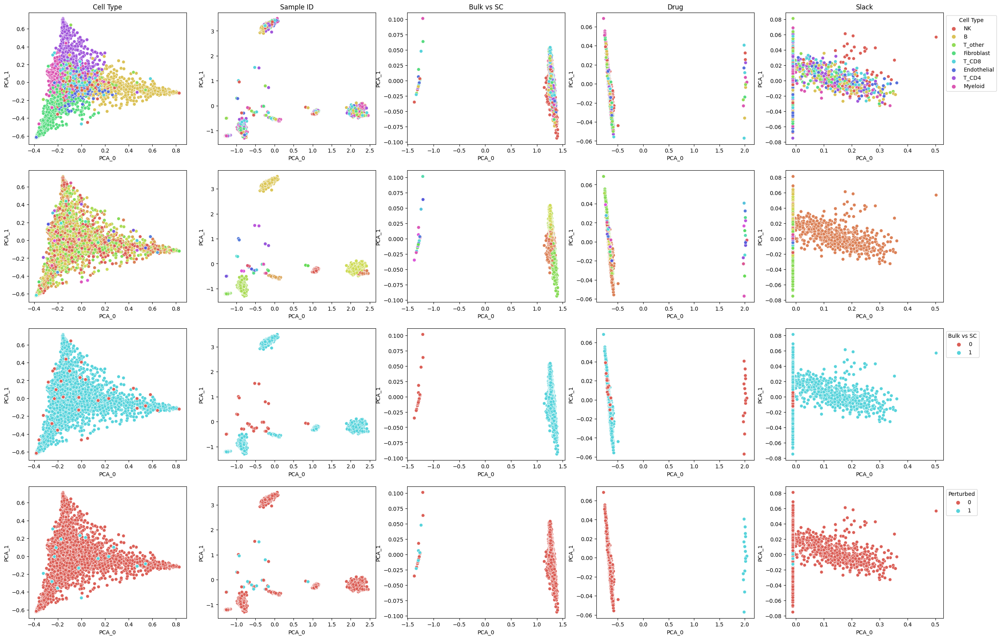

In [66]:

res1_latent_plot = buddi.plot_latent_spaces(res1_enc_unlab, res1_classifier,
                        X_temp, Y_temp, label_temp, perturb_temp, bulk_temp, 
                        batch_size=500, use_buddi4=True, hide_sample_ids=True, use_pca=True)

/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-02-02 18:11:22.193567: W tensorflow/c/c_api.cc:304] Operation '{name:'tf_op_layer_z_samp_slack_13/add/z_samp_slack_13/add' id:78396 op device:{requested: '', assigned: ''} def:{{{node tf_op_layer_z_samp_slack_13/add/z_samp_slack_13/add}} = AddV2[T=DT_FLOAT, _cloned=true, _has_manual_control_dependencies=true](mu_slack_25/BiasAdd, tf_op_layer_z_samp_slack_13/mul/z_samp_slack_13/mul)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-02 18:11:24.902603: W tensorflow/c/c_api.cc:304] Operation '{name:

(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)


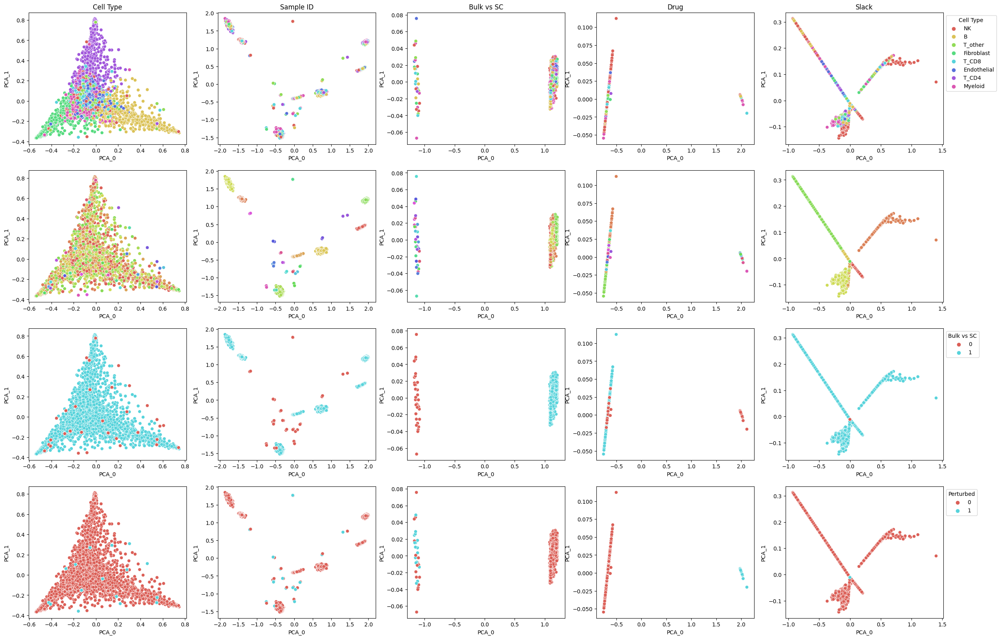

In [67]:

res2_latent_plot = buddi.plot_latent_spaces(res2_enc_unlab, res2_classifier,
                        X_temp, Y_temp, label_temp, perturb_temp, bulk_temp, 
                        batch_size=500, use_buddi4=True, hide_sample_ids=True)

/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-02-02 18:11:33.311687: W tensorflow/c/c_api.cc:304] Operation '{name:'tf_op_layer_z_samp_slack_14/add/z_samp_slack_14/add' id:79325 op device:{requested: '', assigned: ''} def:{{{node tf_op_layer_z_samp_slack_14/add/z_samp_slack_14/add}} = AddV2[T=DT_FLOAT, _cloned=true, _has_manual_control_dependencies=true](mu_slack_27/BiasAdd, tf_op_layer_z_samp_slack_14/mul/z_samp_slack_14/mul)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-02-02 18:11:36.050158: W tensorflow/c/c_api.cc:304] Operation '{name:

(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)


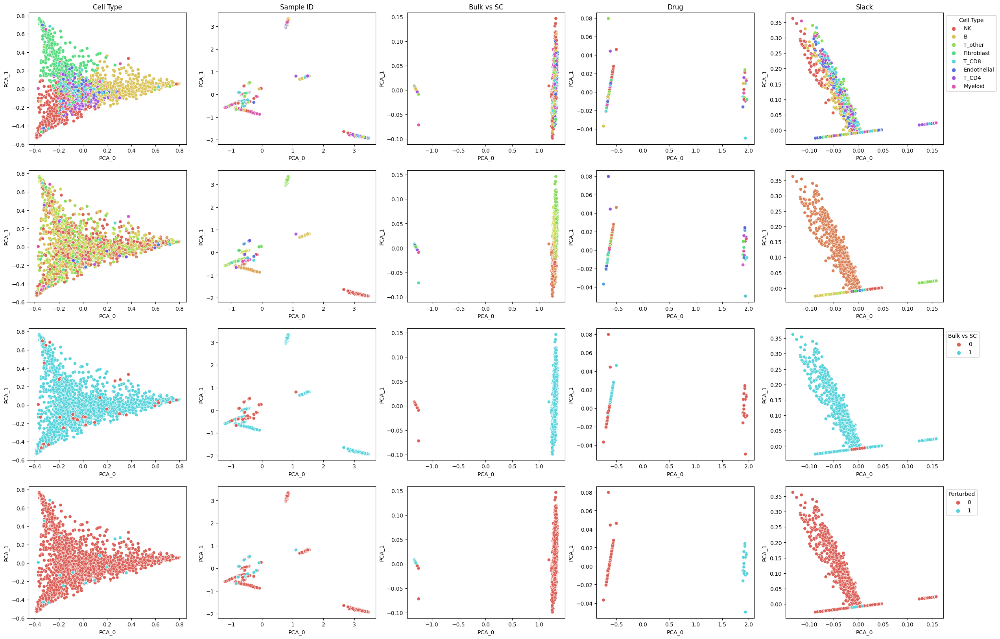

In [68]:

res3_latent_plot = buddi.plot_latent_spaces(res3_enc_unlab, res3_classifier,
                        X_temp, Y_temp, label_temp, perturb_temp, bulk_temp, 
                        batch_size=500, use_buddi4=True, hide_sample_ids=True)

## visualize reconstruction

### subset data

In [69]:
# take all training data

recon_idx = np.where(np.logical_and(meta_df.cell_prop_type == "realistic", meta_df.isTraining == "Train"))[0]
recon_idx = np.where(recon_idx)[0]
recon_idx = np.random.choice(recon_idx, 1000, replace=True)

# subset our data

meta_temp = meta_df.iloc[recon_idx]

X_temp = np.copy(X_full[recon_idx])

Y_temp = np.copy(Y_full.iloc[recon_idx])
Y_temp = np.argmax(Y_temp, axis=1)
Y_temp = Y_full.columns[Y_temp]


label_temp = np.copy(Label_full[recon_idx])
label_temp = index_label[label_temp]

perturb_temp = Drug_full[recon_idx]




### plot data

In [70]:
Y_full.iloc[recon_idx]

,NK,B,Endothelial,Fibroblast,Myeloid,T_CD4,T_CD8,T_other
0,0.095,0.020,0.155,0.665,0.010,0.030,0.005,0.020
0,0.010,0.040,0.055,0.055,0.015,0.015,0.225,0.585
0,0.120,0.200,0.200,0.015,0.030,0.025,0.355,0.055
0,0.020,0.060,0.035,0.095,0.150,0.025,0.400,0.215
0,0.020,0.060,0.035,0.095,0.150,0.025,0.400,0.215
...,...,...,...,...,...,...,...,...
0,0.020,0.710,0.035,0.030,0.030,0.125,0.035,0.015
0,0.010,0.005,0.005,0.020,0.930,0.005,0.005,0.020
0,0.005,0.005,0.015,0.005,0.005,0.955,0.005,0.005
0,0.010,0.245,0.070,0.040,0.040,0.230,0.355,0.010


/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-02-02 18:11:46.107717: W tensorflow/c/c_api.cc:304] Operation '{name:'decoder_out_49/Sigmoid' id:77941 op device:{requested: '', assigned: ''} def:{{{node decoder_out_49/Sigmoid}} = Sigmoid[T=DT_FLOAT, _has_manual_control_dependencies=true](decoder_out_49/BiasAdd)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


(2000, 2)
(2000, 2)


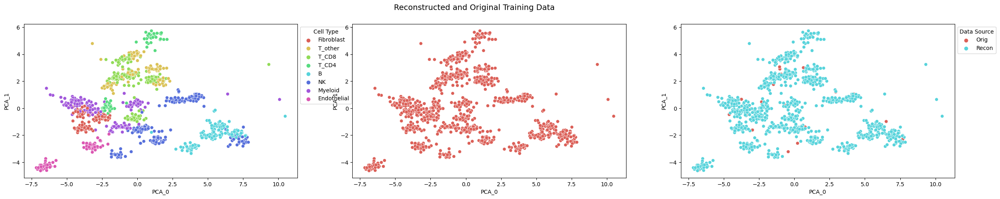

In [71]:
res1_recon_plot = buddi.plot_reconstruction_buddi(res1_enc_unlab, res1_classifier, res1_dec,
        X_temp, Y_temp, label_temp, perturb_temp, 
        batch_size=500, use_buddi4=True)

/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-02-02 18:11:49.003577: W tensorflow/c/c_api.cc:304] Operation '{name:'decoder_out_50/Sigmoid' id:78870 op device:{requested: '', assigned: ''} def:{{{node decoder_out_50/Sigmoid}} = Sigmoid[T=DT_FLOAT, _has_manual_control_dependencies=true](decoder_out_50/BiasAdd)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


(2000, 2)
(2000, 2)


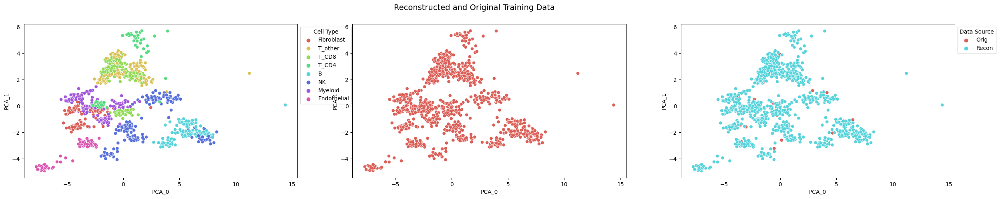

In [72]:
res2_recon_plot = buddi.plot_reconstruction_buddi(res2_enc_unlab, res2_classifier, res2_dec,
        X_temp, Y_temp, label_temp, perturb_temp, 
        batch_size=500, use_buddi4=True)

/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-02-02 18:11:51.916964: W tensorflow/c/c_api.cc:304] Operation '{name:'decoder_out_51/Sigmoid' id:79799 op device:{requested: '', assigned: ''} def:{{{node decoder_out_51/Sigmoid}} = Sigmoid[T=DT_FLOAT, _has_manual_control_dependencies=true](decoder_out_51/BiasAdd)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


(2000, 2)
(2000, 2)


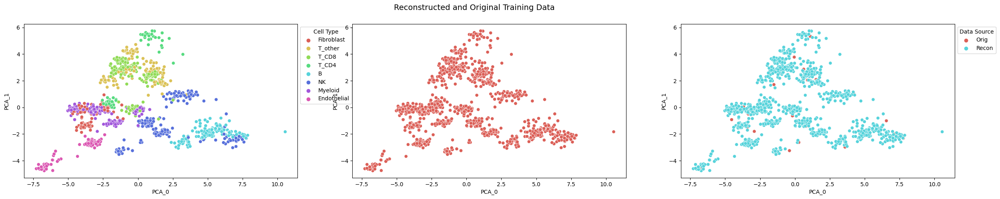

In [73]:
res3_recon_plot = buddi.plot_reconstruction_buddi(res3_enc_unlab, res3_classifier, res3_dec,
        X_temp, Y_temp, label_temp, perturb_temp, 
        batch_size=500, use_buddi4=True)